In [151]:
import datetime
import sys
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import shap
import scipy as scipy
import statsmodels.api as sm
from scipy import stats
from scipy.stats import (
    chi2_contingency,
    mannwhitneyu,
    ttest_ind,
    shapiro,
    norm,
    kruskal,
    levene,
    pointbiserialr
)
from statsmodels.formula.api import ols

from matplotlib.lines import Line2D
from matplotlib import colors
from matplotlib.colors import ListedColormap
from mpl_toolkits.mplot3d import Axes3D

from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.ensemble import (
    GradientBoostingClassifier,
    RandomForestClassifier,
    AdaBoostClassifier
)
from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    classification_report,
    recall_score,
    precision_score,
    f1_score,
    roc_auc_score,
    roc_curve,
    auc,
    ConfusionMatrixDisplay
)
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV,
    KFold,
    cross_val_score,
    cross_val_predict,
    StratifiedKFold
)
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.svm import SVC, NuSVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from scikeras.wrappers import KerasClassifier
from tensorflow.keras.utils import to_categorical

from yellowbrick.cluster import KElbowVisualizer

warnings.simplefilter("ignore")
pd.set_option("display.max_columns", None)
if not sys.warnoptions:
    warnings.simplefilter("ignore")

np.set_printoptions(precision=4)
sns.set()

%matplotlib inline


Loading the dataset and getting a first look at the data

In [152]:
df = pd.read_csv("/Users/jason/Desktop/ML_CA2/healthcare_dataset.csv")

In [153]:
df

,Age,BMI,BloodPressure,Cholesterol,Glucose,Insulin,HeartRate,Smoker,PhysicalActivity,SleepTime,MedicalHistoryScore,IncomeLevel,StressLevel,HealthIns,Disease
0,56,27.577099,88.0,108.0,92,171,75,0,Medium,9,5,High,Low,No,Disease_B
1,69,26.233744,88.0,252.0,102,179,71,0,High,9,3,High,Medium,Yes,Disease_A
2,46,29.646620,152.0,141.0,89,198,90,1,Low,5,5,Medium,Medium,No,Disease_C
3,32,30.619597,106.0,273.0,159,222,64,1,Medium,7,0,Medium,High,No,Disease_C
4,60,16.794395,96.0,172.0,173,30,99,1,Low,7,3,High,Medium,No,Disease_B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,42,32.859689,174.0,140.0,107,248,90,1,High,10,9,High,High,No,Disease_B
4996,39,37.916078,113.0,184.0,180,200,98,1,High,8,5,High,Low,No,Disease_C
4997,48,32.637416,143.0,188.0,82,77,61,1,High,4,1,Medium,High,Yes,Disease_C
4998,34,31.794482,108.0,141.0,76,117,71,1,High,4,2,Low,Medium,No,NaN


# 1. Data Prep 

I'm using the .info() method on my df to check null counts, datatypes, samples, features, and memory usage of the datatype.

In [154]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Age                  5000 non-null   int64  
 1   BMI                  4750 non-null   float64
 2   BloodPressure        4750 non-null   float64
 3   Cholesterol          4750 non-null   float64
 4   Glucose              5000 non-null   int64  
 5   Insulin              5000 non-null   int64  
 6   HeartRate            5000 non-null   int64  
 7   Smoker               5000 non-null   int64  
 8   PhysicalActivity     5000 non-null   object 
 9   SleepTime            5000 non-null   int64  
 10  MedicalHistoryScore  5000 non-null   int64  
 11  IncomeLevel          5000 non-null   object 
 12  StressLevel          5000 non-null   object 
 13  HealthIns            5000 non-null   object 
 14  Disease              3742 non-null   object 
dtypes: float64(3), int64(7), object(5)
mem

### 1.1 Renaming the data

In [155]:
df.columns = [
'age',
'bmi',
'blood_pressure',
'cholesterol',
'glucose',
'insulin',
'heart_rate',
'smoker',
'physical_activity',
'sleep_time',
'medical_history_score',
'income_level',
'stress_level',
'health_ins',
'disease',
]

### 1.2 Check for Null Data

In [156]:
(df.isnull().sum()/5000)*100

age                       0.00
bmi                       5.00
blood_pressure            5.00
cholesterol               5.00
glucose                   0.00
insulin                   0.00
heart_rate                0.00
smoker                    0.00
physical_activity         0.00
sleep_time                0.00
medical_history_score     0.00
income_level              0.00
stress_level              0.00
health_ins                0.00
disease                  25.16
dtype: float64

### 1.21 Target Variable

As the data dictionary only states there to be Diseaseas A, B, C and "None". I will presume the NaN value to mean No disease. Otherwise, I would choose to delete the missing values' rows as they belong to the target feature.

In [157]:
df['disease'].unique()

array(['Disease_B', 'Disease_A', 'Disease_C', nan], dtype=object)

In [158]:
df['disease'].fillna('No_Disease', inplace=True)

### 1.22 Predictor Variables

As "bmi", "blood_pressure" and "cholesterol" are all floats, and their missing values only account for 5% of their respective features I will replace the missing values with the proceding value, also known as the backfill method. Imputing the Median leads to weird weird distributions.

In [159]:
df['bmi'].fillna(method='bfill', inplace=True)

In [160]:
df['blood_pressure'].fillna(method='bfill', inplace=True)

In [161]:
df['cholesterol'].fillna(method='bfill', inplace=True)

### 1.3 Check for Duplicates 

In [162]:
df.duplicated().sum()

0

### 1.4 Split our data by datatype

I am turning smoker into it's categorical data and splitting my data up into gruops based on their data types. Numerical feats in num_feats, Categorical features in cat_feats. Categorical is made up of two sub groups binary_feats and multi_feats. 

I am also adding a df_borrow which is just a copy of the cleaned data. I may find useful later on in the project.

In [163]:
df['smoker'][df['smoker'] == 0] = 'non_smoker'
df['smoker'][df['smoker'] == 1] = 'smoker'

In [164]:
num_feats = df[['age', 'bmi', 'blood_pressure', 'cholesterol', 'glucose', 'insulin', 'heart_rate', 'sleep_time', 'medical_history_score']]

In [165]:
bin_feats = df[['smoker', 'health_ins']]

In [166]:
multi_feats = df[['physical_activity', 'income_level', 'stress_level', 'disease']]

In [167]:
cat_feats = df[['smoker', 'health_ins','physical_activity', 'income_level', 'stress_level', 'disease']]

In [168]:
df_borrow = df

# EDA

## 2.1 Target Distribution

I then use a count plot using Seaborn to visualize the distribution of the 'disease' variable in the dataset. I added a percentage label above each bar and customised the plot's appearance with labels, title, and tick parameters.

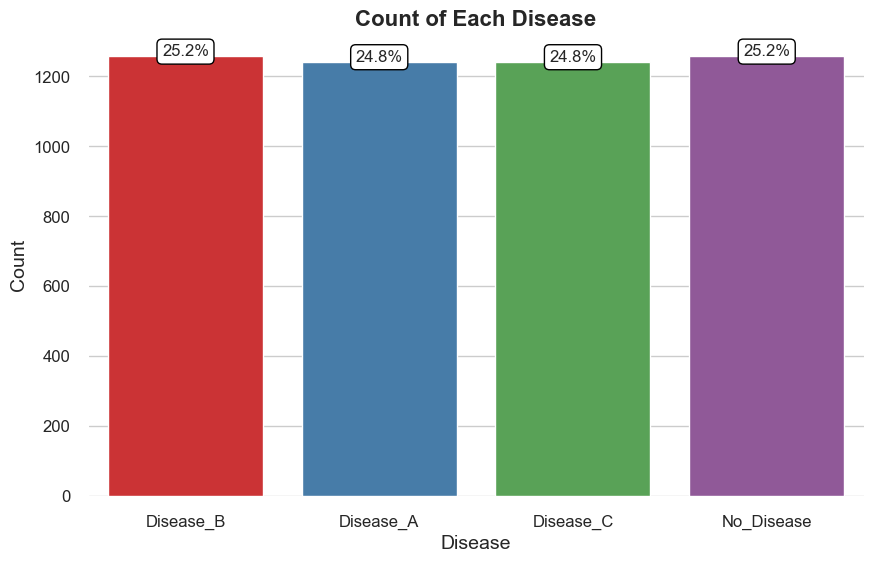

In [169]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=df, x='disease', palette='Set1')
plt.xlabel('Disease', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Count of Each Disease', fontsize=16, fontweight='bold')
total = float(len(df))
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2.,
            height + 0.2,
            '{:1.1f}%'.format((height / total) * 100),
            ha="center",
            fontsize=12,
            bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3', linewidth=1))
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)
sns.despine(left=True, bottom=True)
plt.show()

We can see that the target variable is very well balanced

## 2.2 Numerical Features

I use the .describe() method here and .T which tranposes the rows into columns and vice versa. I can use this to make a statistical analysis and summary of the dataset.

In [170]:
num_feats.describe().T

,count,mean,std,min,25%,50%,75%,max
age,5000.0,48.80560,17.906991,18.000000,34.000000,49.000000,64.000000,79.000000
bmi,5000.0,27.32267,7.187082,15.000291,21.046527,27.196681,33.539535,39.988943
blood_pressure,5000.0,129.74420,28.687045,80.000000,105.000000,130.000000,155.000000,179.000000
cholesterol,5000.0,199.66860,58.241370,100.000000,149.000000,201.000000,250.000000,299.000000
glucose,5000.0,137.44060,47.448072,70.000000,103.000000,136.000000,167.000000,582.000000
insulin,5000.0,146.57320,82.623127,15.000000,78.000000,144.000000,213.000000,744.000000
heart_rate,5000.0,80.34200,13.914919,60.000000,70.000000,80.000000,89.000000,198.000000
sleep_time,5000.0,7.48220,2.281562,4.000000,5.000000,7.000000,9.000000,11.000000
medical_history_score,5000.0,4.48540,2.852405,0.000000,2.000000,4.000000,7.000000,9.000000


In the following cells I use the same code so instead of repeating the same thing for each one I'll give a bried summary of what I'm doing here;

I used a stacked histogram with Seaborn to visualize the distribution of my different Numerical Features with my disease column set as my hue. I use a whitegird background and 'Set1' palette with a Kernel Density Estimate (KDE) overlay, and bold title.

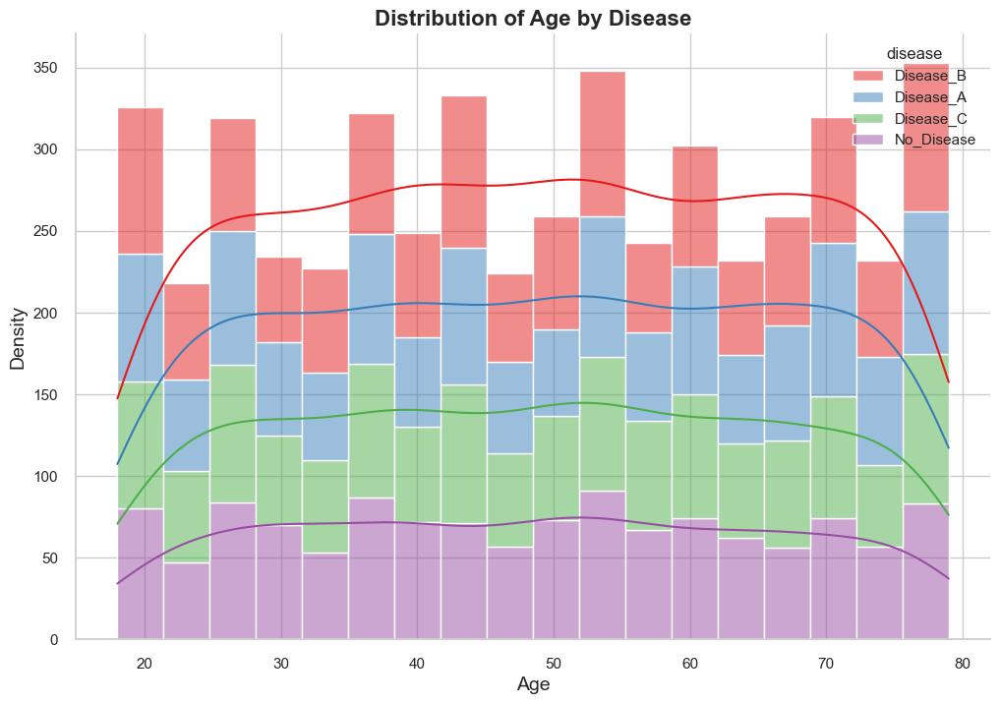

In [171]:
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x='age', hue='disease', kde=True, palette='Set1', multiple='stack')
plt.xlabel('Age', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.title('Distribution of Age by Disease', fontsize=16, fontweight='bold')
sns.despine(right=True)
plt.show()

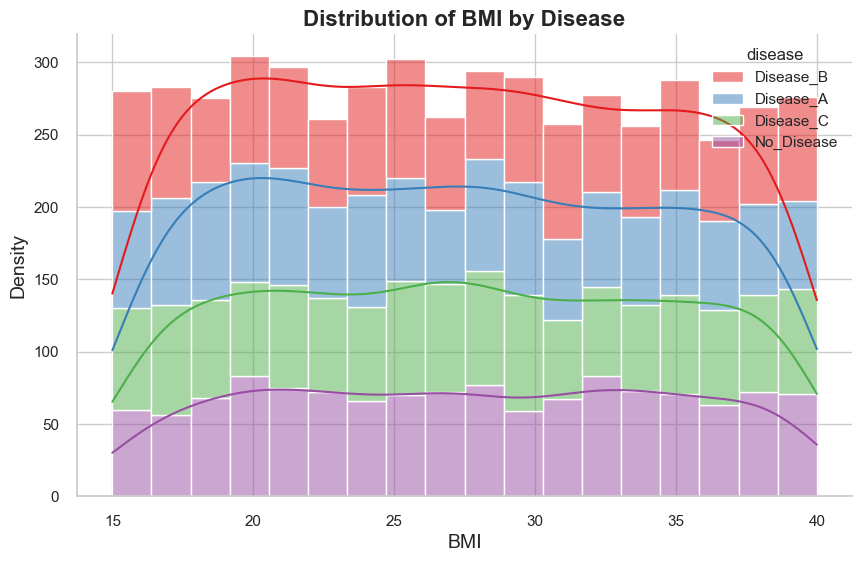

In [172]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
sns.histplot(data=df, x='bmi', hue='disease', kde=True, palette='Set1', multiple='stack')
plt.xlabel('BMI', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.title('Distribution of BMI by Disease', fontsize=16, fontweight='bold')
sns.despine(right=True)
plt.show()

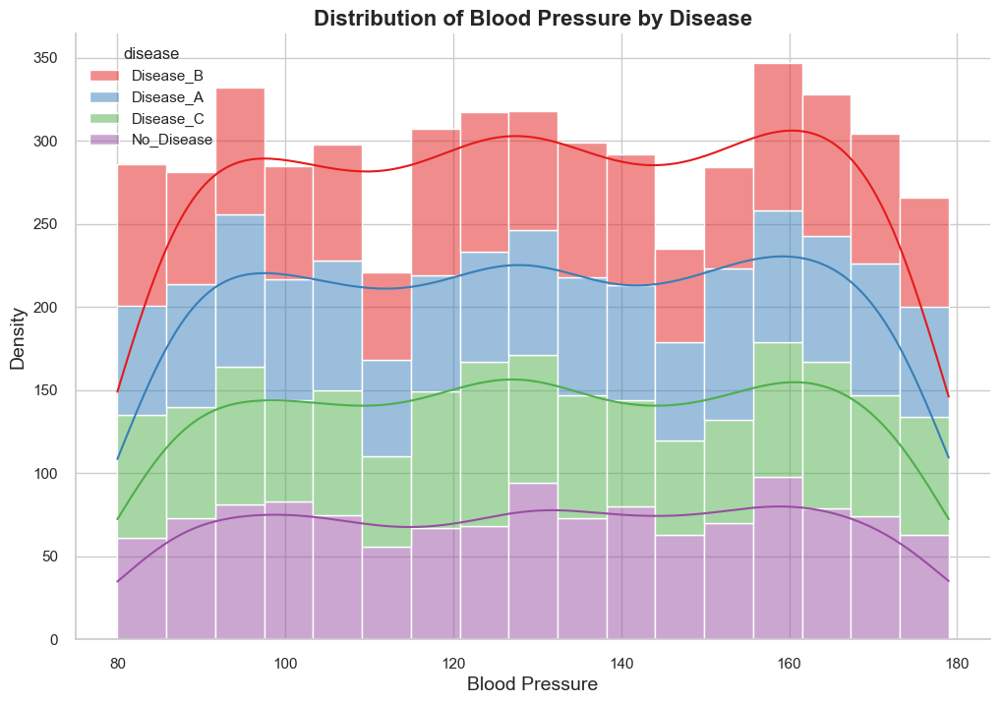

In [173]:
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x='blood_pressure', hue='disease', kde=True, palette='Set1', multiple='stack')
plt.xlabel('Blood Pressure', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.title('Distribution of Blood Pressure by Disease', fontsize=16, fontweight='bold')
sns.despine(right=True)
plt.show()

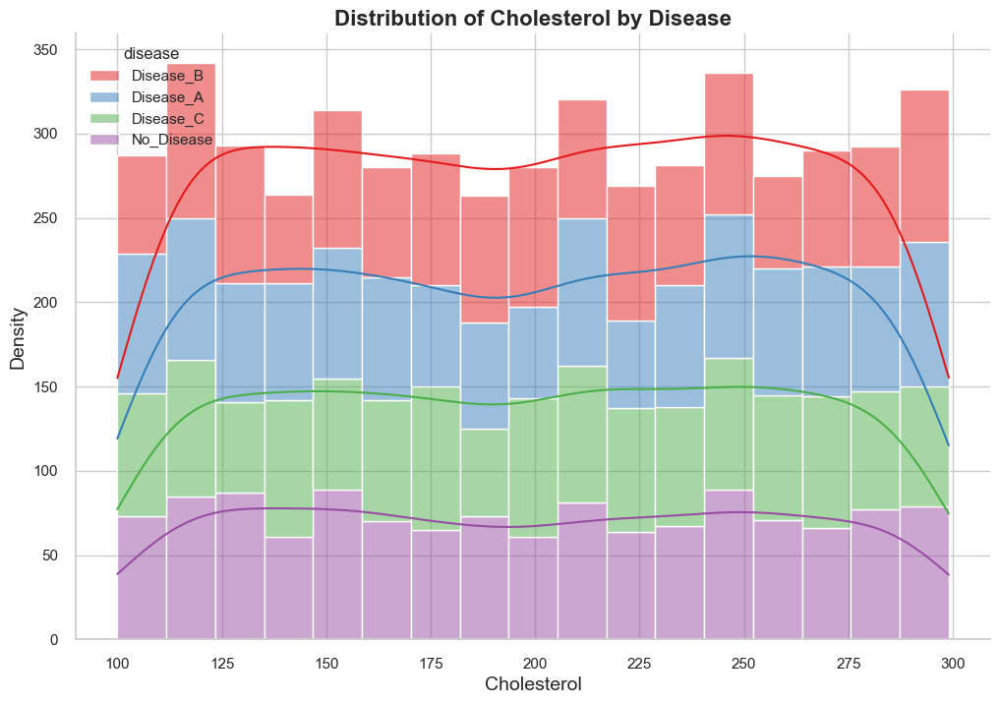

In [174]:
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x='cholesterol', hue='disease', kde=True, palette='Set1', multiple='stack')
plt.xlabel('Cholesterol', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.title('Distribution of Cholesterol by Disease', fontsize=16, fontweight='bold')
sns.despine(right=True)
plt.show()

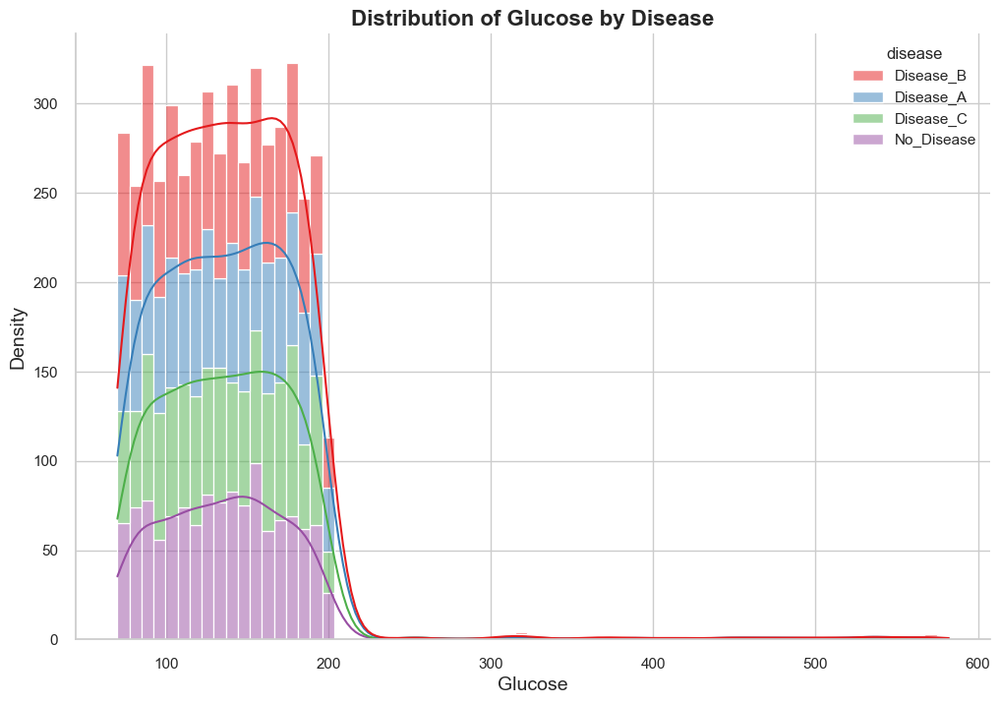

In [175]:
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x='glucose', hue='disease', kde=True, palette='Set1', multiple='stack')
plt.xlabel('Glucose', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.title('Distribution of Glucose by Disease', fontsize=16, fontweight='bold')
sns.despine(right=True)
plt.show()

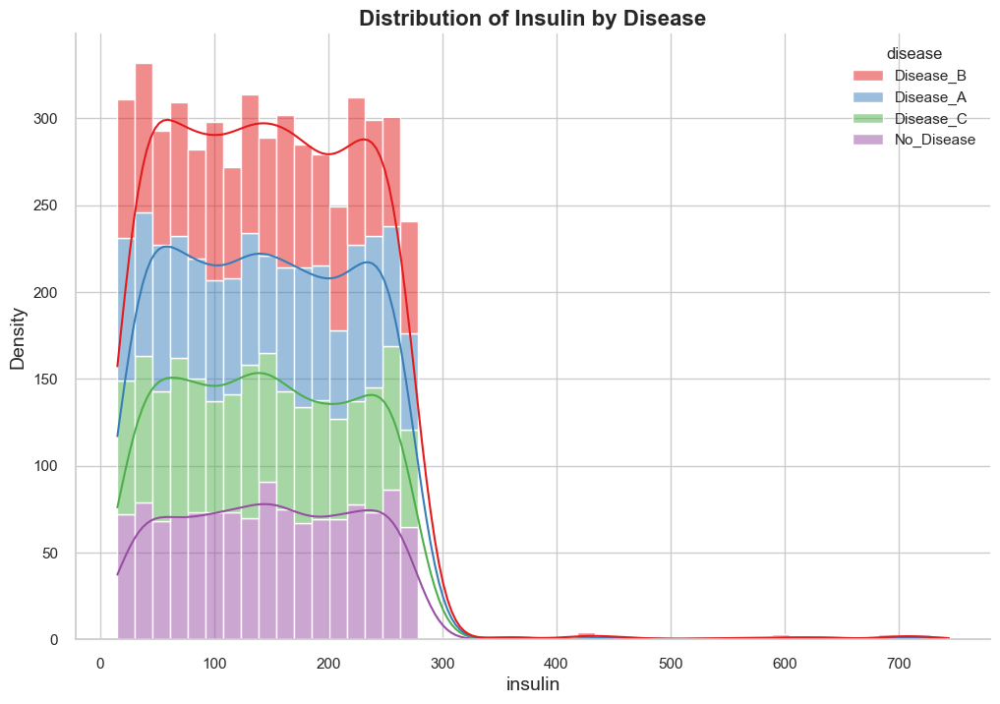

In [176]:
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x='insulin', hue='disease', kde=True, palette='Set1', multiple='stack')
plt.xlabel('insulin', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.title('Distribution of Insulin by Disease', fontsize=16, fontweight='bold')
sns.despine(right=True)
plt.show()

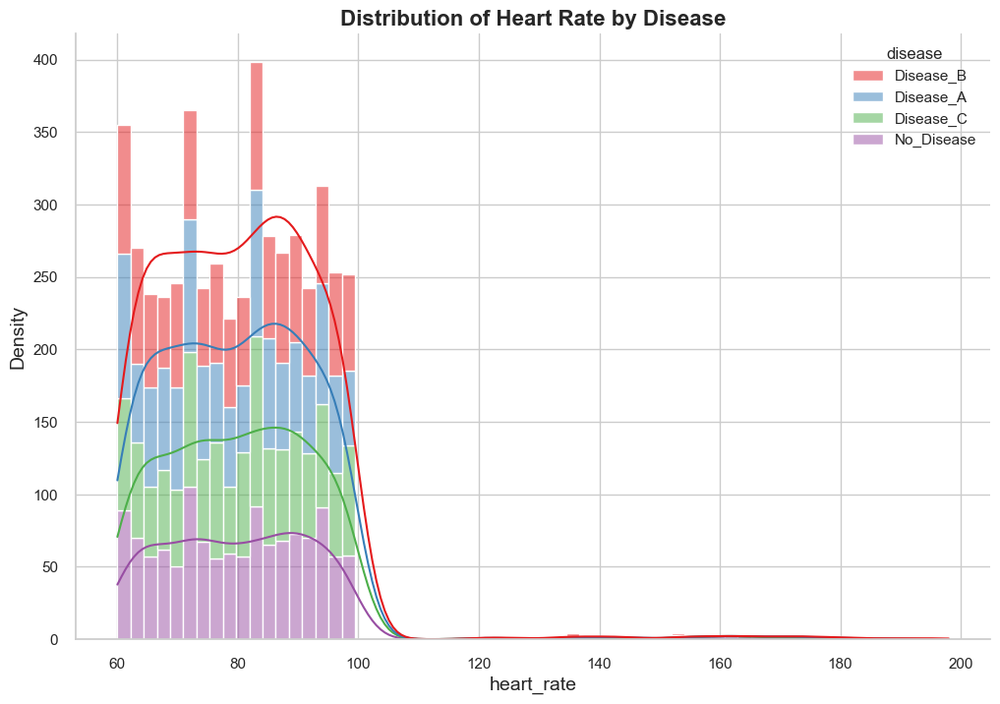

In [177]:
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x='heart_rate', hue='disease', kde=True, palette='Set1', multiple='stack')
plt.xlabel('heart_rate', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.title('Distribution of Heart Rate by Disease', fontsize=16, fontweight='bold')
sns.despine(right=True)
plt.show()

*With my one exception being Medical History Score where I needed to use a barplot for easier visluasing.

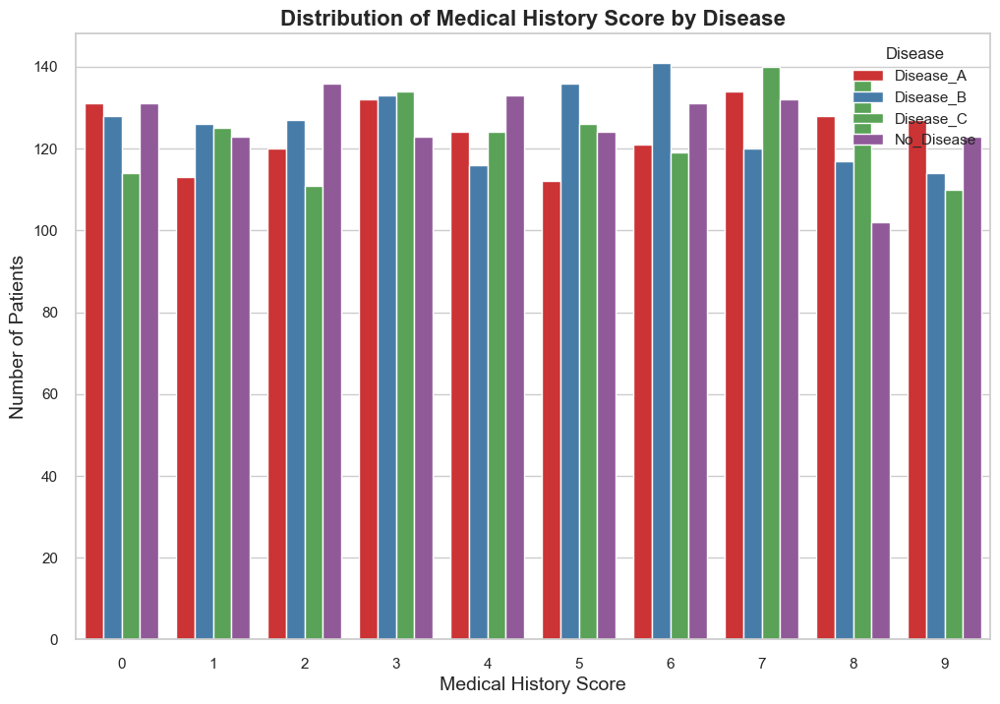

In [178]:
grouped_data = df.groupby(['medical_history_score', 'disease']).size().reset_index(name='count')
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))
barplot = sns.barplot(data=grouped_data,
                      x='medical_history_score', 
                      y='count',
                      hue='disease',
                      palette='Set1',
                      dodge=True)
plt.title('Distribution of Medical History Score by Disease', fontsize=16, fontweight='bold')
plt.xlabel('Medical History Score', fontsize=14)
plt.ylabel('Number of Patients', fontsize=14)
handles, labels = barplot.get_legend_handles_labels()
plt.legend(handles, labels, title='Disease')
plt.show()

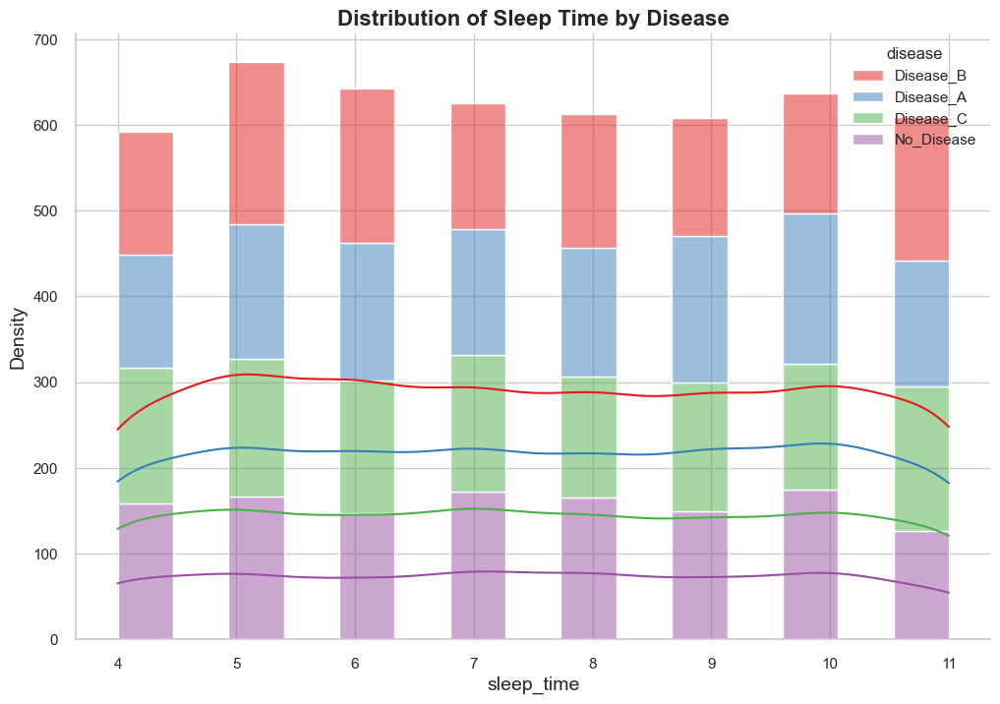

In [179]:
sns.set(style="whitegrid")
plt.figure(figsize=(12, 8))
sns.histplot(data=df, x='sleep_time', hue='disease', kde=True, palette='Set1', multiple='stack')
plt.xlabel('sleep_time', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.title('Distribution of Sleep Time by Disease', fontsize=16, fontweight='bold')
sns.despine(right=True)
plt.show()

## 2.3 Pairplot

Below I use a seaborn Pairplot to plot the relationship between each of my Numerical features.
I use my Disease feature again as my hue, I only plot the lower triangle of the pair plot matrix to reduce redundancy, use hists along the diagonal so you can easily see the distributions, and keep my Set1 Palette.

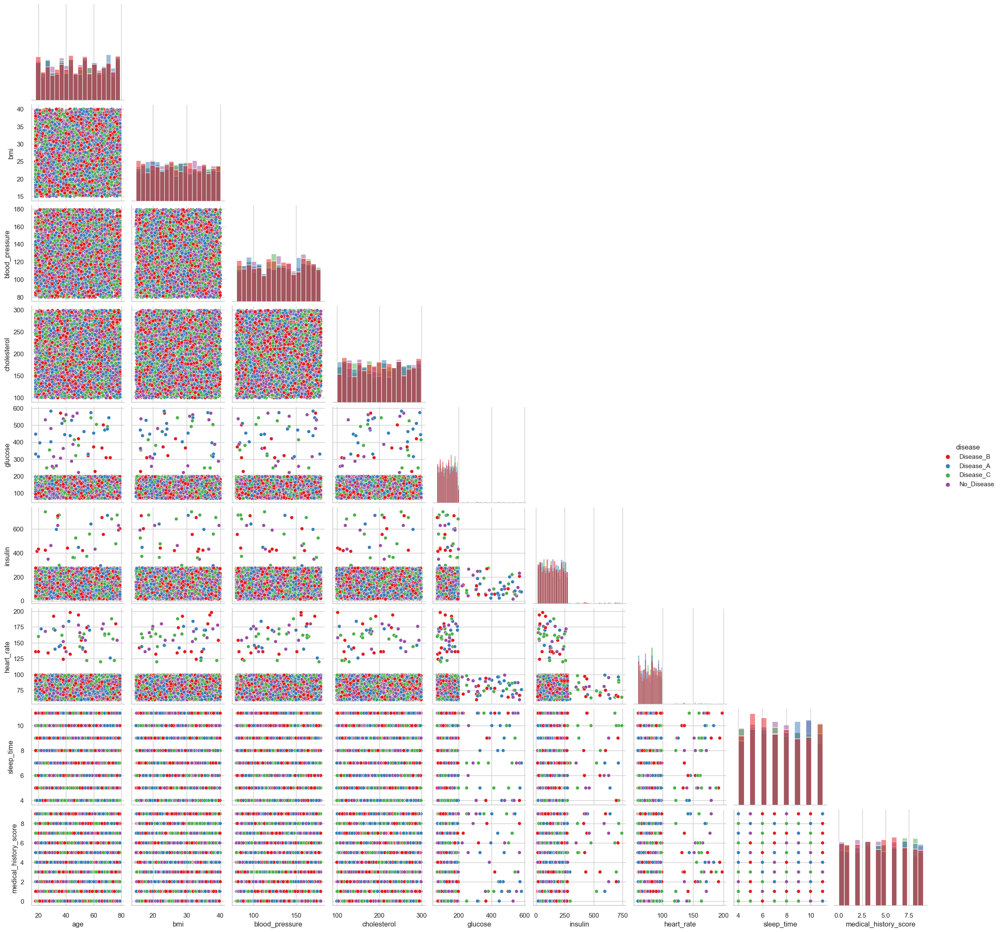

In [180]:
num_feats = ['age', 'bmi', 'blood_pressure', 'cholesterol', 'glucose', 'insulin', 'heart_rate', 'sleep_time', 'medical_history_score']
pairplot = sns.pairplot(df[num_feats + ['disease']], hue='disease', corner=True, diag_kind='hist', palette='Set1')
plt.show()

Very hectic pairplots with very very minimal visible corelations if any.

## 2.4 Outliers

We can see from the distribution plots and pairplots that Glucose, Insulin and Heart Rate have outliers affecting their plots. So we're going to calculate, find and remove them with the Inter Quartile Range (IQR) method & replot them with Seaborn.

*I actually changed this from deleting the rows to imputing the median in commit 5 on github!

<Axes: xlabel='glucose', ylabel='Density'>

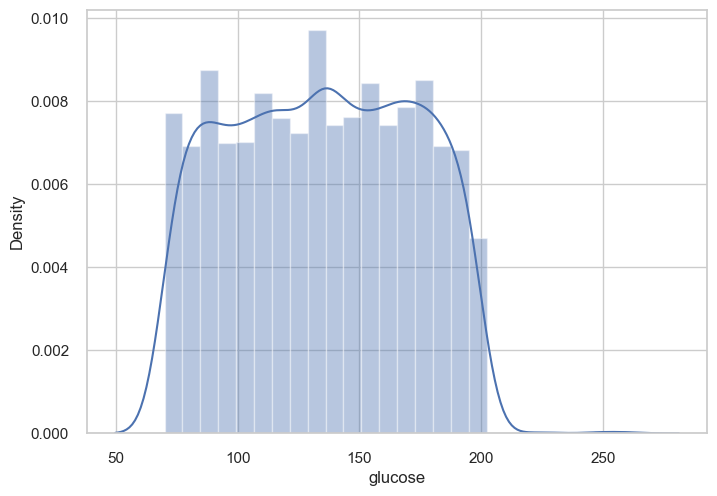

In [181]:
Q1 = df['glucose'].quantile(0.25)
Q3 = df['glucose'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

median_value = df['glucose'].median()

df['glucose'] = df['glucose'].apply(lambda x: median_value if x < lower_bound or x > upper_bound else x)

sns.distplot(df['glucose'])

<Axes: xlabel='insulin', ylabel='Density'>

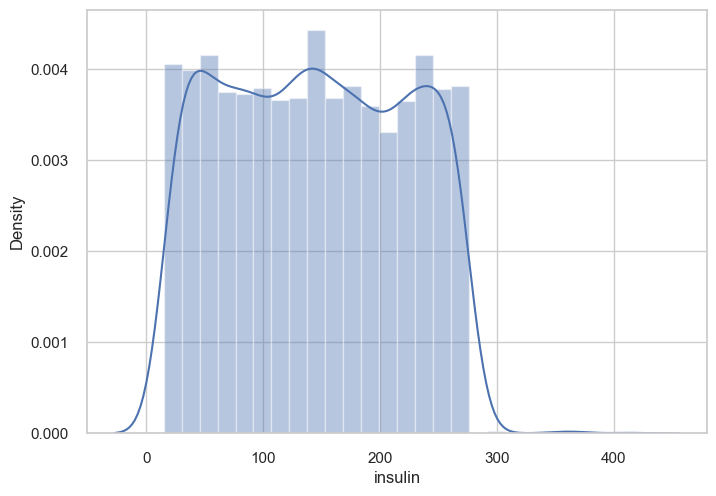

In [182]:
Q1 = df['insulin'].quantile(0.25)
Q3 = df['insulin'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

median_value = df['insulin'].median()

df['insulin'] = df['insulin'].apply(lambda x: median_value if x < lower_bound or x > upper_bound else x)

sns.distplot(df['insulin'])

<Axes: xlabel='heart_rate', ylabel='Density'>

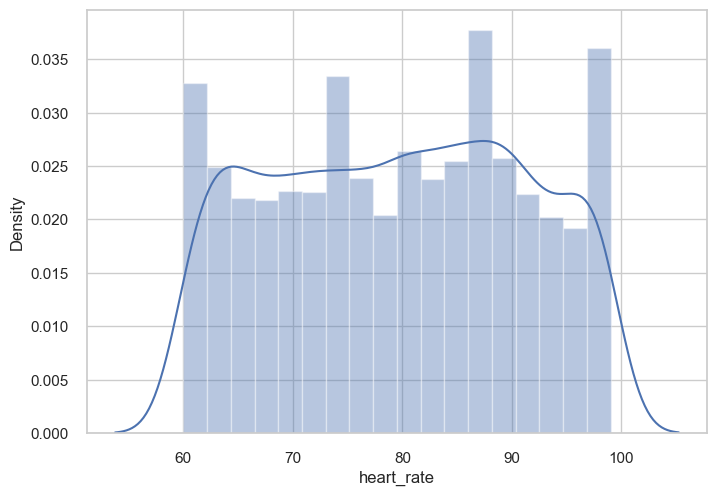

In [183]:
Q1 = df['heart_rate'].quantile(0.25)
Q3 = df['heart_rate'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR


median_value = df['heart_rate'].median()

df['heart_rate'] = df['heart_rate'].apply(lambda x: median_value if x < lower_bound or x > upper_bound else x)

sns.distplot(df['heart_rate'])

Just updating my duplicate df here

In [184]:
df_borrow = df

## 2.5 Categorical Features

Next I will repeat the process with my Categorical Features. I will used a grouped bar plot instead, but will keep disease as my hue, and the visuals such as background, palette etc.

Below Each grouped bar plot I say which group holds the higher proportion for each disease ie) If I write "Smoker" beside Disease A, then there are more "Smokers" in Disease A than "Non-Smokers" or "Social Smokers" for example.
Results return some very unintuitive/unexpected answers.

I used the describe() and .T methods again below.

In [185]:
cat_feats.describe().T

,count,unique,top,freq
smoker,5000,2,smoker,2552
health_ins,5000,2,Yes,2506
physical_activity,5000,3,Medium,1748
income_level,5000,3,Low,1681
stress_level,5000,3,Low,1696
disease,5000,4,Disease_B,1258


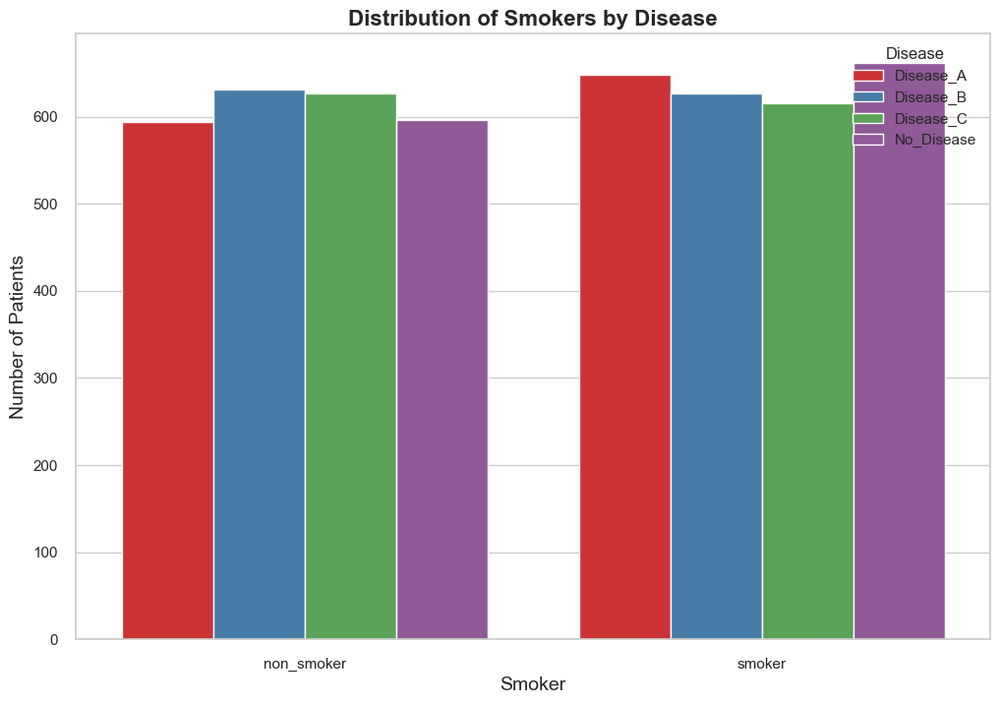

In [186]:
grouped_data = df.groupby(['smoker', 'disease']).size().reset_index(name='count')
sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))
barplot = sns.barplot(data=grouped_data,
                      x='smoker', 
                      y='count',
                      hue='disease',
                      palette='Set1',
                      dodge=True)

plt.title('Distribution of Smokers by Disease', fontsize=16, fontweight='bold')
plt.xlabel('Smoker', fontsize=14)
plt.ylabel('Number of Patients', fontsize=14)
handles, labels = barplot.get_legend_handles_labels()
plt.legend(handles, labels, title='Disease')

plt.show()

Disease A: Smoker 
Disease B: Non Smoker
Disease C: Non Smoker
Disease D: Smoker

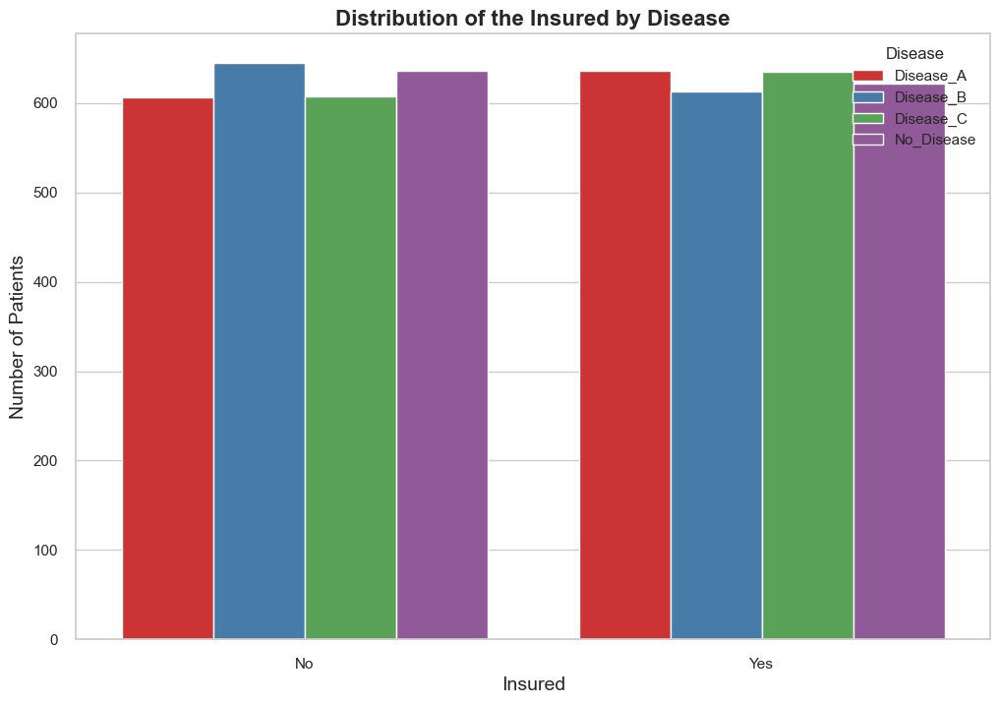

In [187]:
grouped_data = df.groupby(['health_ins', 'disease']).size().reset_index(name='count')

sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))
barplot = sns.barplot(data=grouped_data,
                      x='health_ins', 
                      y='count',
                      hue='disease',
                      palette='Set1',
                      dodge=True)

plt.title('Distribution of the Insured by Disease', fontsize=16, fontweight='bold')
plt.xlabel('Insured', fontsize=14)
plt.ylabel('Number of Patients', fontsize=14)
handles, labels = barplot.get_legend_handles_labels()
plt.legend(handles, labels, title='Disease')

plt.show()

Disease A: Yes
Disease B: No
Disease C: Yes
Disease D: No

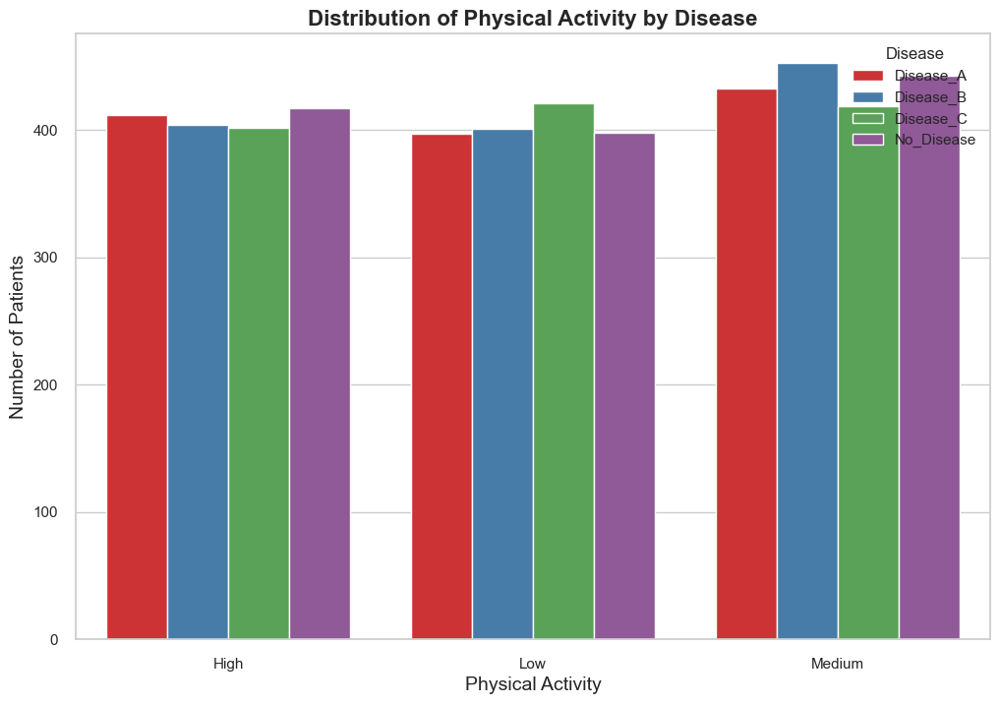

In [188]:
grouped_data = df.groupby(['physical_activity', 'disease']).size().reset_index(name='count')

sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))
barplot = sns.barplot(data=grouped_data,
                      x='physical_activity', 
                      y='count',
                      hue='disease',
                      palette='Set1',
                      dodge=True)

plt.title('Distribution of Physical Activity by Disease', fontsize=16, fontweight='bold')
plt.xlabel('Physical Activity', fontsize=14)
plt.ylabel('Number of Patients', fontsize=14)
handles, labels = barplot.get_legend_handles_labels()
plt.legend(handles, labels, title='Disease')

plt.show()

Disease A: Medium
Disease B: Medium
Disease C: Low
Disease D: Medium

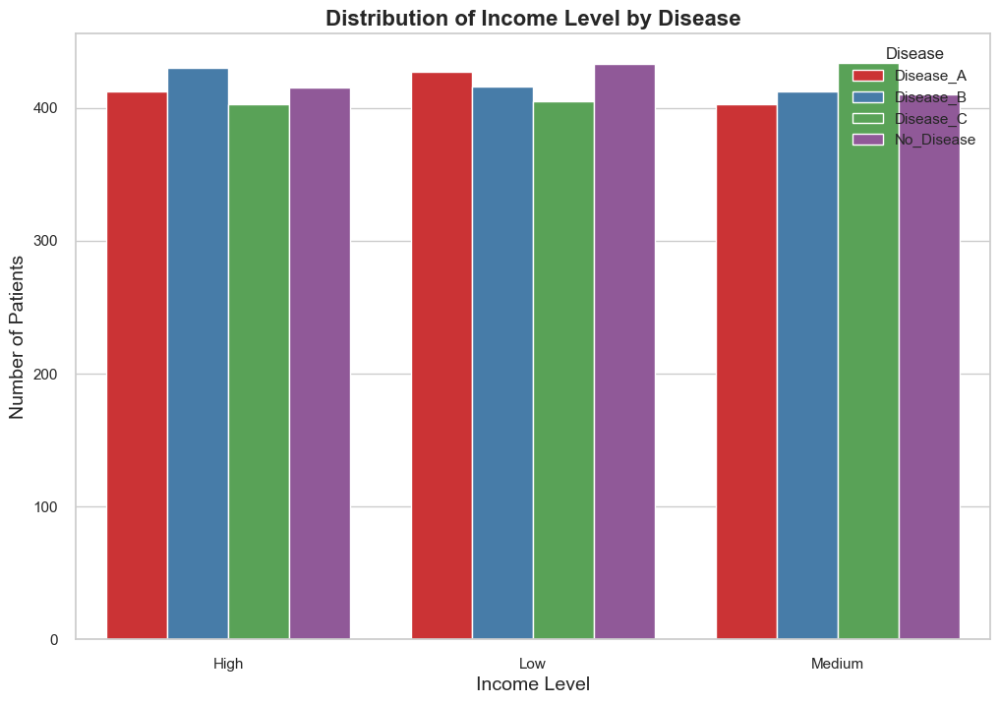

In [189]:
grouped_data = df.groupby(['income_level', 'disease']).size().reset_index(name='count')

sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))
barplot = sns.barplot(data=grouped_data,
                      x='income_level', 
                      y='count',
                      hue='disease',
                      palette='Set1',
                      dodge=True)

plt.title('Distribution of Income Level by Disease', fontsize=16, fontweight='bold')
plt.xlabel('Income Level', fontsize=14)
plt.ylabel('Number of Patients', fontsize=14)
handles, labels = barplot.get_legend_handles_labels()
plt.legend(handles, labels, title='Disease')

plt.show()

Disease A: Low
Disease B: High
Disease C: Medium
Disease D: Low

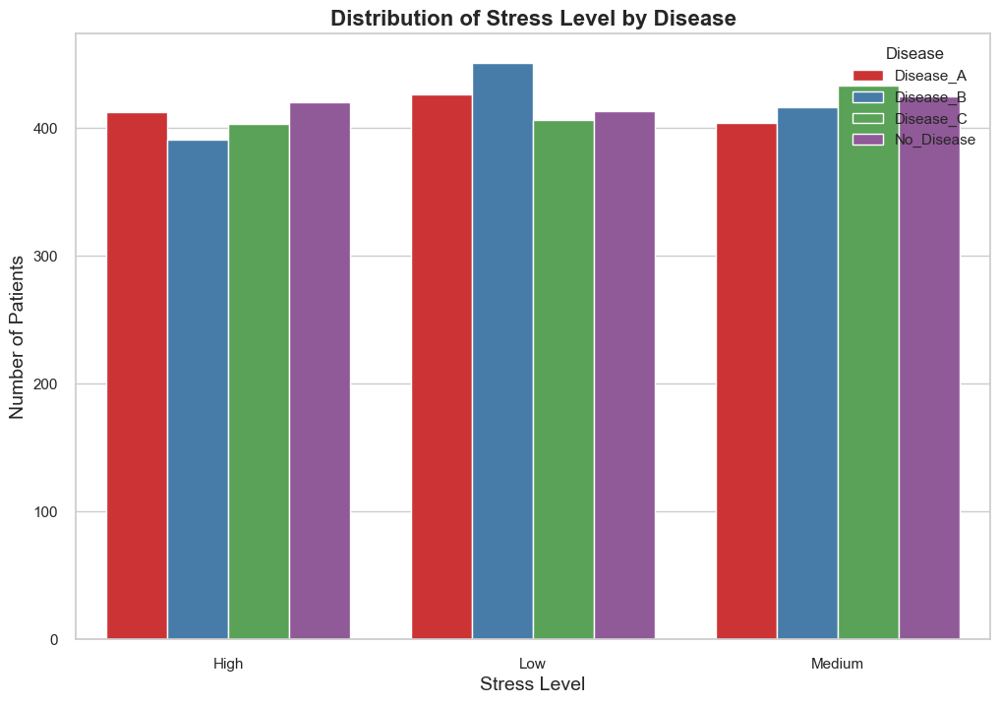

In [190]:
grouped_data = df.groupby(['stress_level', 'disease']).size().reset_index(name='count')

sns.set(style="whitegrid")

plt.figure(figsize=(12, 8))
barplot = sns.barplot(data=grouped_data,
                      x='stress_level', 
                      y='count',
                      hue='disease',
                      palette='Set1',
                      dodge=True)

plt.title('Distribution of Stress Level by Disease', fontsize=16, fontweight='bold')
plt.xlabel('Stress Level', fontsize=14)
plt.ylabel('Number of Patients', fontsize=14)
handles, labels = barplot.get_legend_handles_labels()
plt.legend(handles, labels, title='Disease')

plt.show()

Disease A: Low
Disease B: Low
Disease C: Medium
Disease D: High

In [191]:
df

,age,bmi,blood_pressure,cholesterol,glucose,insulin,heart_rate,smoker,physical_activity,sleep_time,medical_history_score,income_level,stress_level,health_ins,disease
0,56,27.577099,88.0,108.0,92.0,171.0,75.0,non_smoker,Medium,9,5,High,Low,No,Disease_B
1,69,26.233744,88.0,252.0,102.0,179.0,71.0,non_smoker,High,9,3,High,Medium,Yes,Disease_A
2,46,29.646620,152.0,141.0,89.0,198.0,90.0,smoker,Low,5,5,Medium,Medium,No,Disease_C
3,32,30.619597,106.0,273.0,159.0,222.0,64.0,smoker,Medium,7,0,Medium,High,No,Disease_C
4,60,16.794395,96.0,172.0,173.0,30.0,99.0,smoker,Low,7,3,High,Medium,No,Disease_B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,42,32.859689,174.0,140.0,107.0,248.0,90.0,smoker,High,10,9,High,High,No,Disease_B
4996,39,37.916078,113.0,184.0,180.0,200.0,98.0,smoker,High,8,5,High,Low,No,Disease_C
4997,48,32.637416,143.0,188.0,82.0,77.0,61.0,smoker,High,4,1,Medium,High,Yes,Disease_C
4998,34,31.794482,108.0,141.0,76.0,117.0,71.0,smoker,High,4,2,Low,Medium,No,No_Disease


# Statistical Analysis

Here I will do a deep statistical Analysis of my data with 3 hypothesis tests and correlation analysis. I begin with just creating a new dataset copy for simplicities sake.

In [192]:
dataset = df
dataset

,age,bmi,blood_pressure,cholesterol,glucose,insulin,heart_rate,smoker,physical_activity,sleep_time,medical_history_score,income_level,stress_level,health_ins,disease
0,56,27.577099,88.0,108.0,92.0,171.0,75.0,non_smoker,Medium,9,5,High,Low,No,Disease_B
1,69,26.233744,88.0,252.0,102.0,179.0,71.0,non_smoker,High,9,3,High,Medium,Yes,Disease_A
2,46,29.646620,152.0,141.0,89.0,198.0,90.0,smoker,Low,5,5,Medium,Medium,No,Disease_C
3,32,30.619597,106.0,273.0,159.0,222.0,64.0,smoker,Medium,7,0,Medium,High,No,Disease_C
4,60,16.794395,96.0,172.0,173.0,30.0,99.0,smoker,Low,7,3,High,Medium,No,Disease_B
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,42,32.859689,174.0,140.0,107.0,248.0,90.0,smoker,High,10,9,High,High,No,Disease_B
4996,39,37.916078,113.0,184.0,180.0,200.0,98.0,smoker,High,8,5,High,Low,No,Disease_C
4997,48,32.637416,143.0,188.0,82.0,77.0,61.0,smoker,High,4,1,Medium,High,Yes,Disease_C
4998,34,31.794482,108.0,141.0,76.0,117.0,71.0,smoker,High,4,2,Low,Medium,No,No_Disease


First I gonna conduct a simple ANOVA test for 'blood_pressure' with the four categories in my 'disease' column to show I know how the individual parts work. Then I am going to create a more complicated test with a function to run and plot the same test on multiple numerical features in one go.

## 3.1 ANOVA Test 

I used stats.probplot from the scipy.stats to create a Q-Q (quantile-quantile) plot for my 'blood_pressure' feature.

<Figure size 800x550 with 0 Axes>

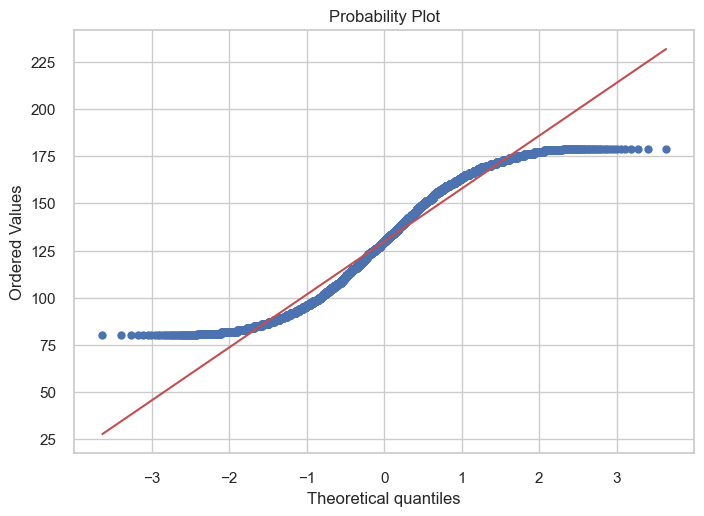

<Figure size 800x550 with 0 Axes>

In [194]:
stats.probplot(dataset.blood_pressure, plot = plt)
plt.figure()

we can see the middle bit of my 'blood_pressure' data is approximately normally distributed

Next I'm going to filter out each one of the categories in my features and do a shapiro test to test for normal distributions. As you can see from the results, the p values are far far off the deault 0.05, rejecting the null hypotheses

In [195]:
stats.shapiro(dataset.blood_pressure[dataset.disease == "Disease_A"])

ShapiroResult(statistic=0.9510093927383423, pvalue=6.319813037565424e-20)

In [196]:
stats.shapiro(dataset.blood_pressure[dataset.disease == "Disease_B"])

ShapiroResult(statistic=0.9551113247871399, pvalue=3.384220258695591e-19)

In [197]:
stats.shapiro(dataset.blood_pressure[dataset.disease == "Disease_C"])

ShapiroResult(statistic=0.9564357399940491, pvalue=8.918233298579748e-19)

In [198]:
stats.shapiro(dataset.blood_pressure[dataset.disease == "No_Disease"])

ShapiroResult(statistic=0.9542662501335144, pvalue=2.2234480448575844e-19)

Im now gonna extract and store the blood pressure values for the different diseases into separate variables. This so I can then easily conduct a levene test to check equality of variances in blood_pressure values across the different disease groups.

In [199]:
Disease_A = dataset.blood_pressure[dataset.disease == "Disease_A"]
Disease_B = dataset.blood_pressure[dataset.disease == "Disease_B"]
Disease_C = dataset.blood_pressure[dataset.disease == "Disease_C"]
No_Disease = dataset.blood_pressure[dataset.disease == "No_Disease"]

In [200]:
levene_test = levene(Disease_A, Disease_B, Disease_C, No_Disease, center= 'mean')
levene_test

LeveneResult(statistic=0.4271023582886928, pvalue=0.7335851945386773)

With a p value of 0.733 we fail to reject the null hypothesis, which suggests that any differences in blood_pressure are not due to differences in variance among the groups

I then conducted an ANOVA test and got the below results. I got a p-value of 0.980442 for the disease factor. Given that the p-value is much greater than 0.05, we fail to reject the null hypothesis, indicating that there are no significant differences in blood pressure between the disease groups.

In [201]:
model = ols('blood_pressure~disease', data = dataset).fit()
aov = sm.stats.anova_lm(model, type = 2)
print(aov)

              df        sum_sq     mean_sq        F    PR(>F)
disease      3.0  1.498446e+02   49.948188  0.06066  0.980442
Residual  4996.0  4.113760e+06  823.410726      NaN       NaN


This is a function to run the anova test and both the Shapiro-Wilk and Levene's test (which I did above in the simple ANOVA test), for an independant and dependant variable, print and then visualise the results. I will walk you through it below. 


ANOVA for bmi:
Shapiro-Wilk test for Disease_B - p-value: 3.056458988259404e-19
Shapiro-Wilk test for Disease_A - p-value: 1.778981800500851e-19
Shapiro-Wilk test for Disease_C - p-value: 5.84007762134702e-19
Shapiro-Wilk test for No_Disease - p-value: 6.530161836163392e-19
Levene's test - p-value: 0.8188600451464878
                   sum_sq      df         F    PR(>F)
C(disease)     264.320245     3.0  1.706429  0.163415
Residual    257954.729796  4996.0       NaN       NaN
There is no significant difference in bmi between the groups.

ANOVA for cholesterol:
Shapiro-Wilk test for Disease_B - p-value: 3.558872724193686e-19
Shapiro-Wilk test for Disease_A - p-value: 6.481742851319343e-21
Shapiro-Wilk test for Disease_C - p-value: 8.748974567663382e-19
Shapiro-Wilk test for No_Disease - p-value: 2.5489082668507112e-20
Levene's test - p-value: 0.06114388505060134
                  sum_sq      df        F    PR(>F)
C(disease)  1.705052e+03     3.0  0.16747  0.918356
Residual    1.695519e

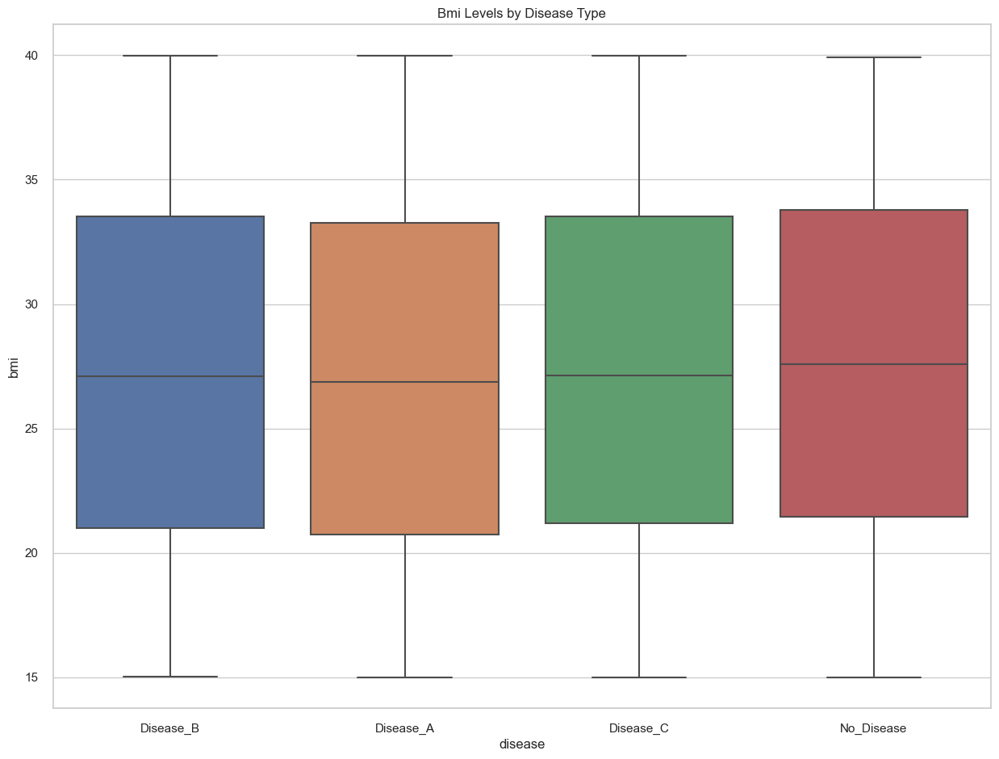

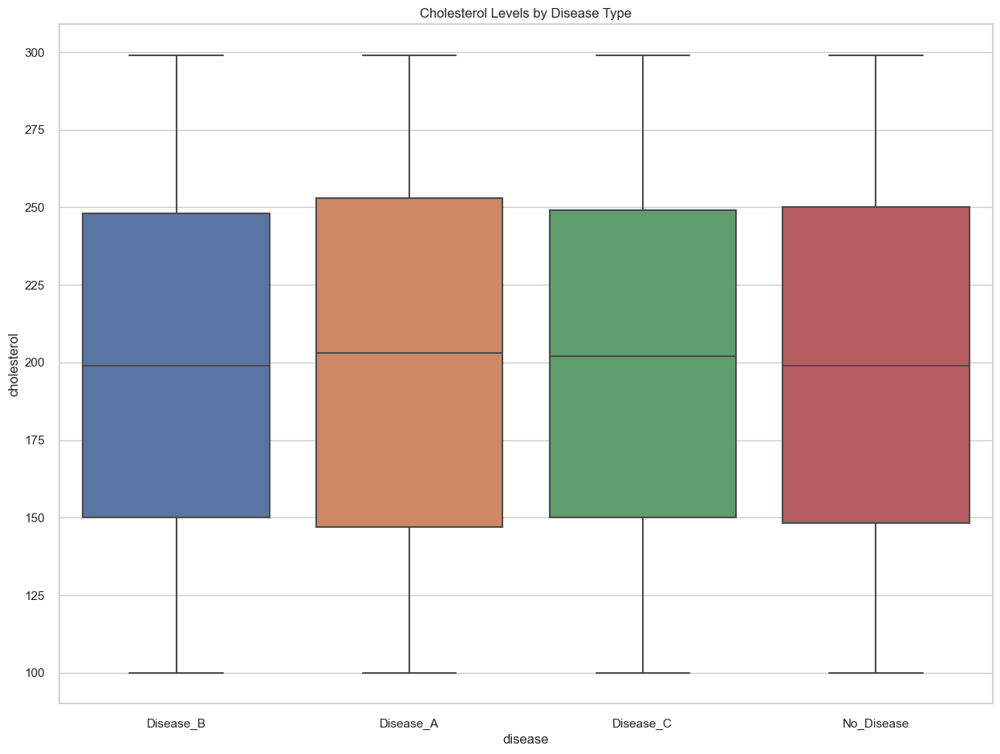

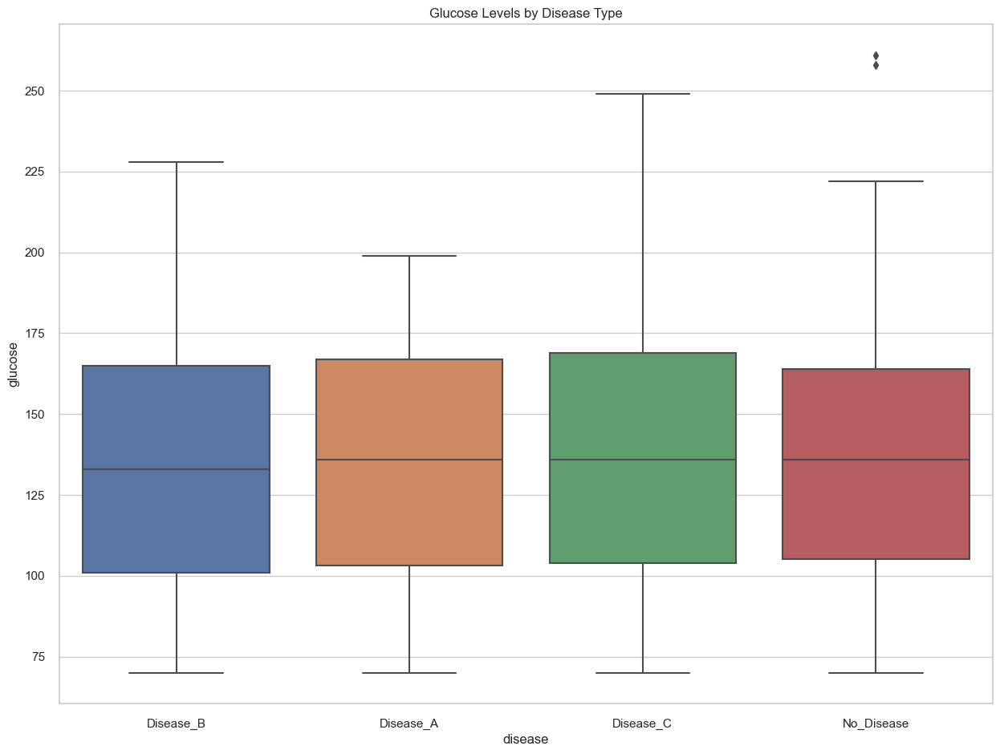

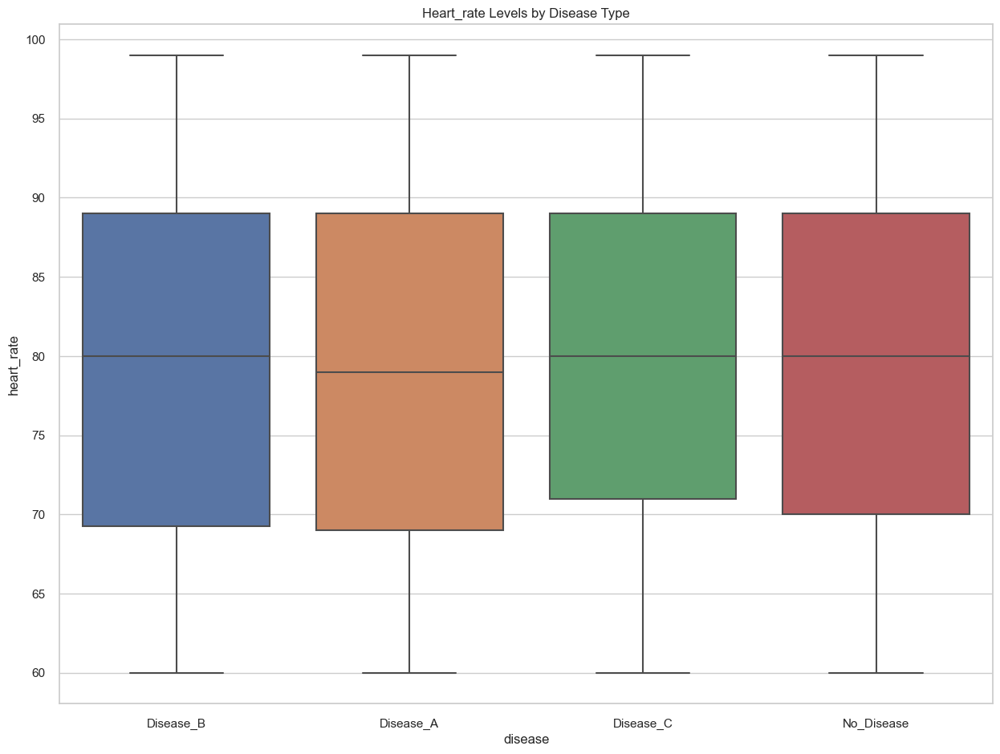

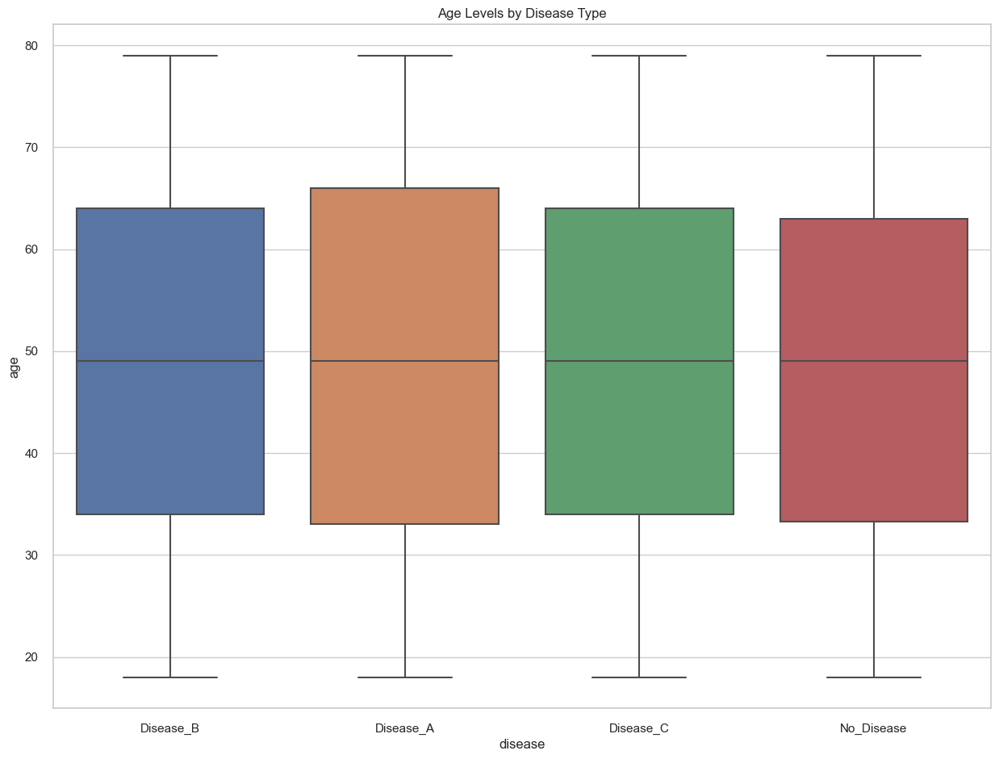

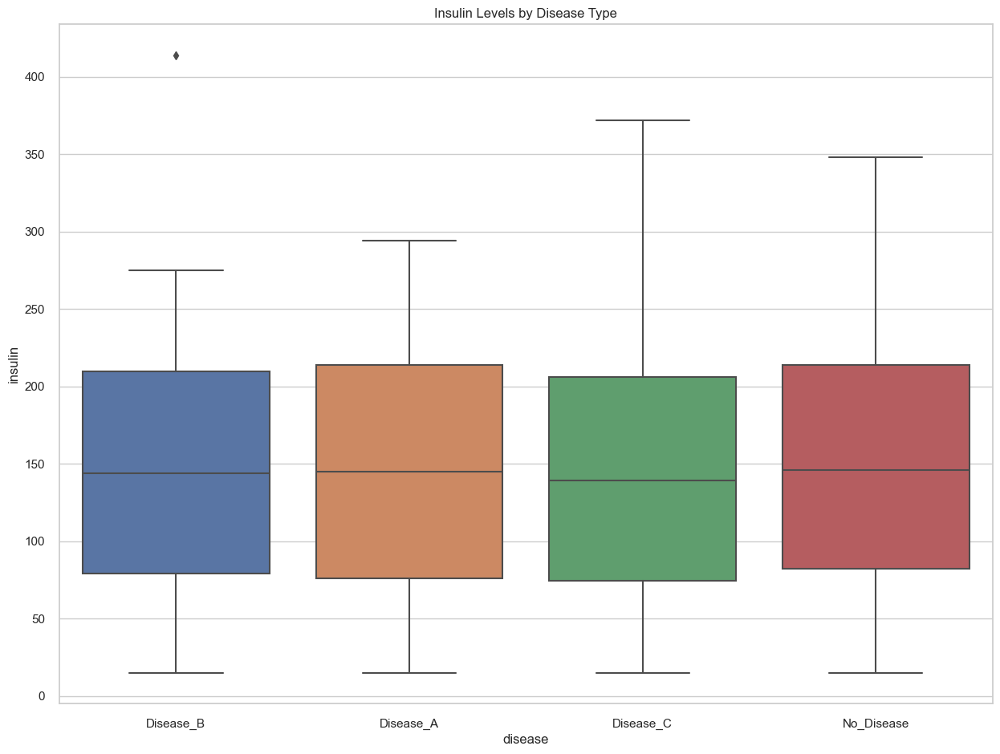

In [202]:
# Define the funtion and then get the unique values of the independent variable
def perform_anova(dependent_var, independent_var, dataset):
    groups = dataset[independent_var].unique()
    #This loop performs the Shapiro Wilkes test for normality & prints the p value
    for group in groups:
        group_data = dataset[dependent_var][dataset[independent_var] == group]
        stat, p = shapiro(group_data)
        print(f'Shapiro-Wilk test for {group} - p-value: {p}')
    #This takes the dependant variable data for all groups and performs the Levene's test
    group_data = [dataset[dependent_var][dataset[independent_var] == group] for group in groups]
    levene_stat, levene_p = levene(*group_data, center='mean')
    print(f"Levene's test - p-value: {levene_p}")
    #Now with both tests done I moved onto the ANOVA test. I just copied the code from the previous test, but replaced blood_pressure 
    # with 'f'{dependent_var} ~ C({independent_var})'
    model = ols(f'{dependent_var} ~ C({independent_var})', data=dataset).fit()
    aov = sm.stats.anova_lm(model, typ=2)
    print(aov)
    # I interpret my results here with a P value set to  0.05 to determine if there is a significant difference in 
    # the dependent variable between groups, and then lets me know with a message, and returns the results.
    if aov['PR(>F)'][0] < 0.05:
        print(f"There is a significant difference in {dependent_var} between the groups.")
    else:
        print(f"There is no significant difference in {dependent_var} between the groups.")
    
    return aov

# The metrics I want to test, my num_feats. The loop then conducts the anova test and prints the results
metrics = ['bmi', 'cholesterol', 'glucose', 'heart_rate', 'age', 'insulin']
# I do the test and results again but I do it before the function call so it's easier to read in the results
for metric in metrics:
    print(f"\nANOVA for {metric}:")
    anova_results = perform_anova(dependent_var=metric, independent_var='disease', dataset=dataset)

#This is where I visualise my results, with a boxplot for each metric, I displayed the distribution of the metric 
# across different disease types.
for metric in metrics:
    plt.figure(figsize=(15, 11))
    sns.boxplot(x='disease', y=metric, data=dataset)
    plt.title(f'{metric.capitalize()} Levels by Disease Type')
    plt.show()

## 3.2 Kruskal-Wallis test


Kruskal-Wallis test for bmi:
Levene's test - p-value: 0.8188600451464878
Kruskal-Wallis test - p-value: 0.15789202572881916
There is no significant difference in bmi between the groups (Kruskal-Wallis).

Kruskal-Wallis test for cholesterol:
Levene's test - p-value: 0.06114388505060134
Kruskal-Wallis test - p-value: 0.9273522890453161
There is no significant difference in cholesterol between the groups (Kruskal-Wallis).

Kruskal-Wallis test for glucose:
Levene's test - p-value: 0.34371476822612473
Kruskal-Wallis test - p-value: 0.2505677466217205
There is no significant difference in glucose between the groups (Kruskal-Wallis).

Kruskal-Wallis test for heart_rate:
Levene's test - p-value: 0.15751053097028359
Kruskal-Wallis test - p-value: 0.2366192527671355
There is no significant difference in heart_rate between the groups (Kruskal-Wallis).

Kruskal-Wallis test for age:
Levene's test - p-value: 0.3138477946692778
Kruskal-Wallis test - p-value: 0.6894423515696582
There is no significan

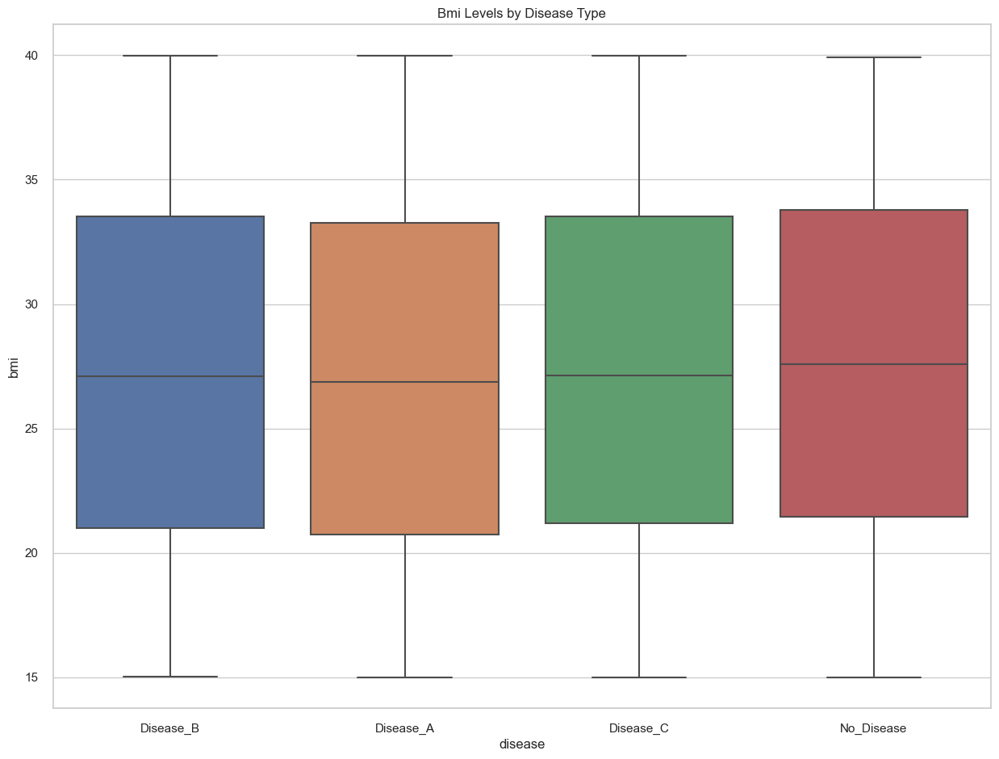

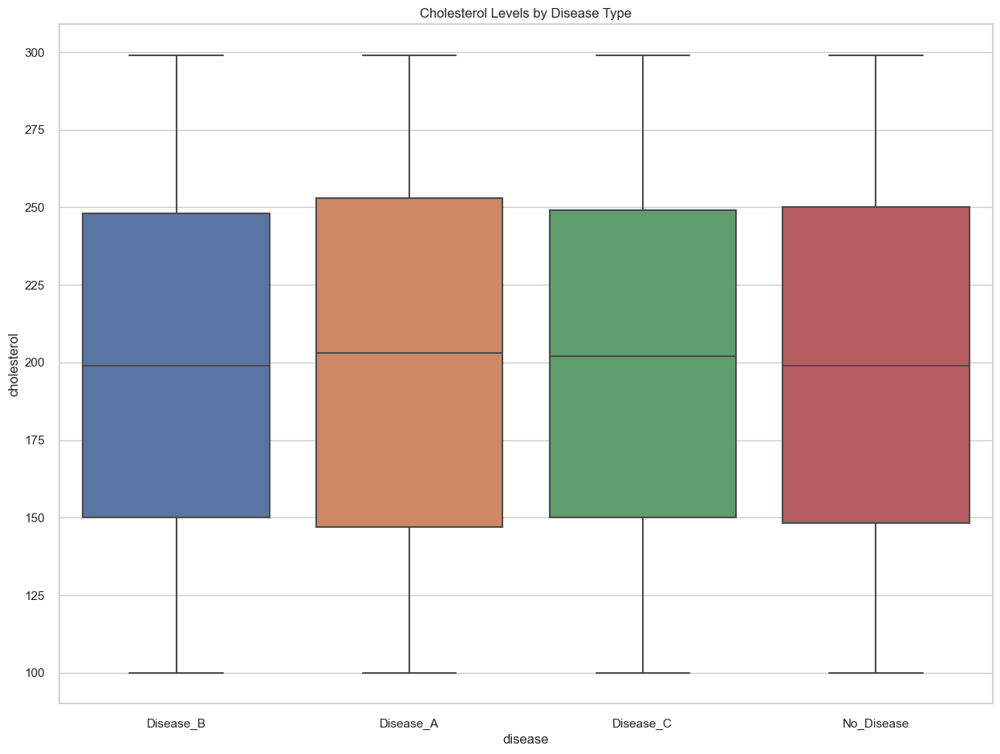

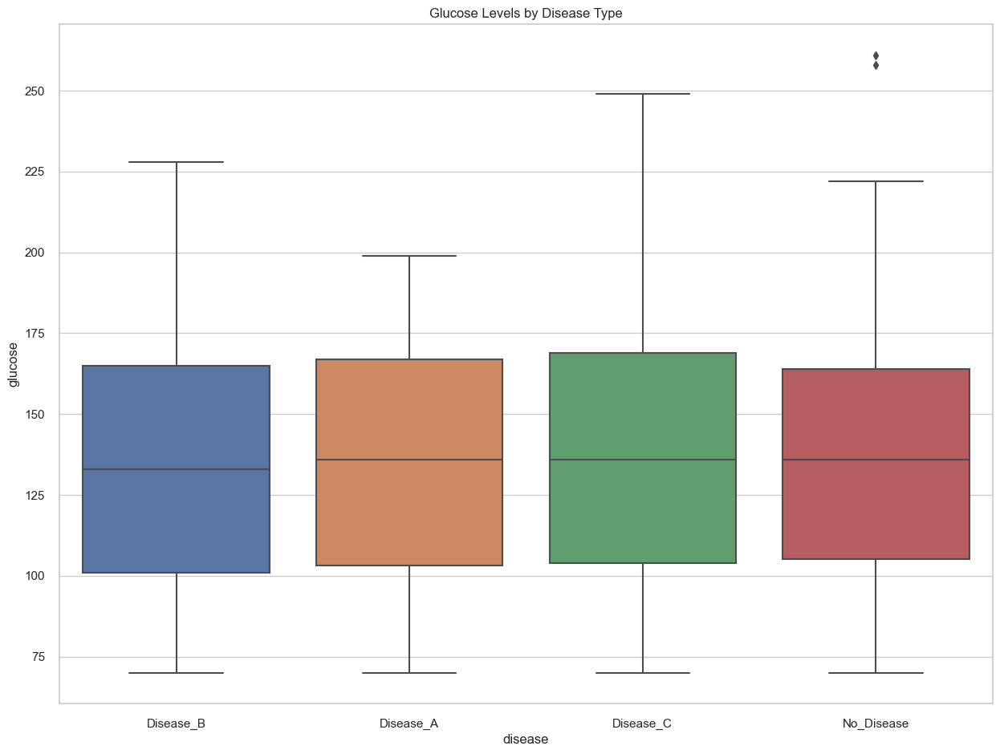

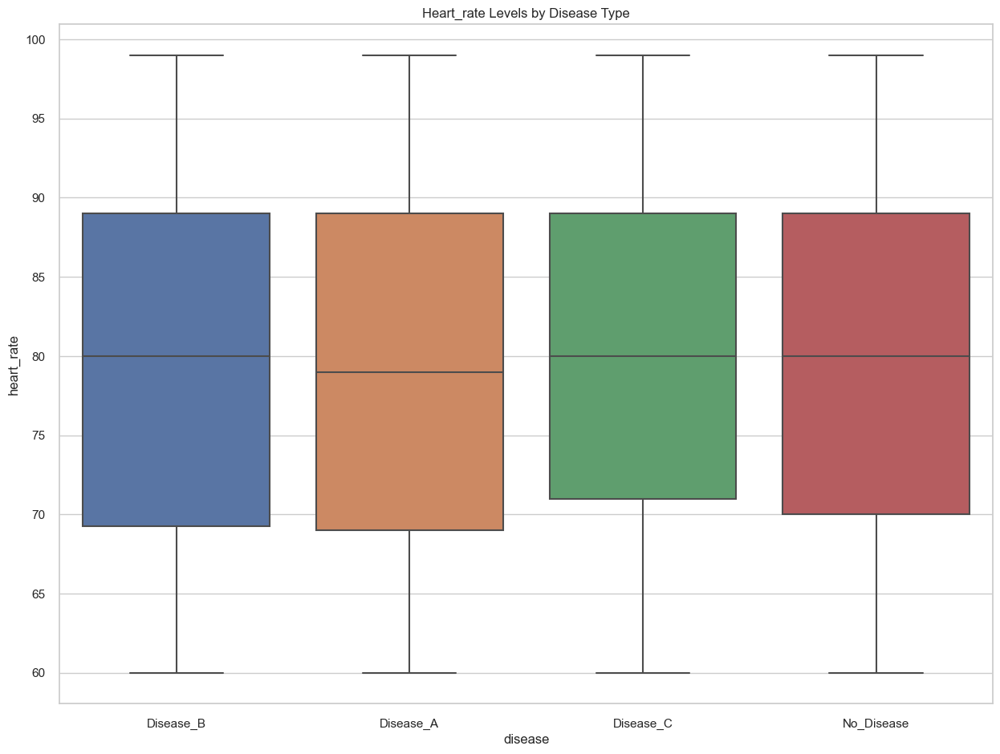

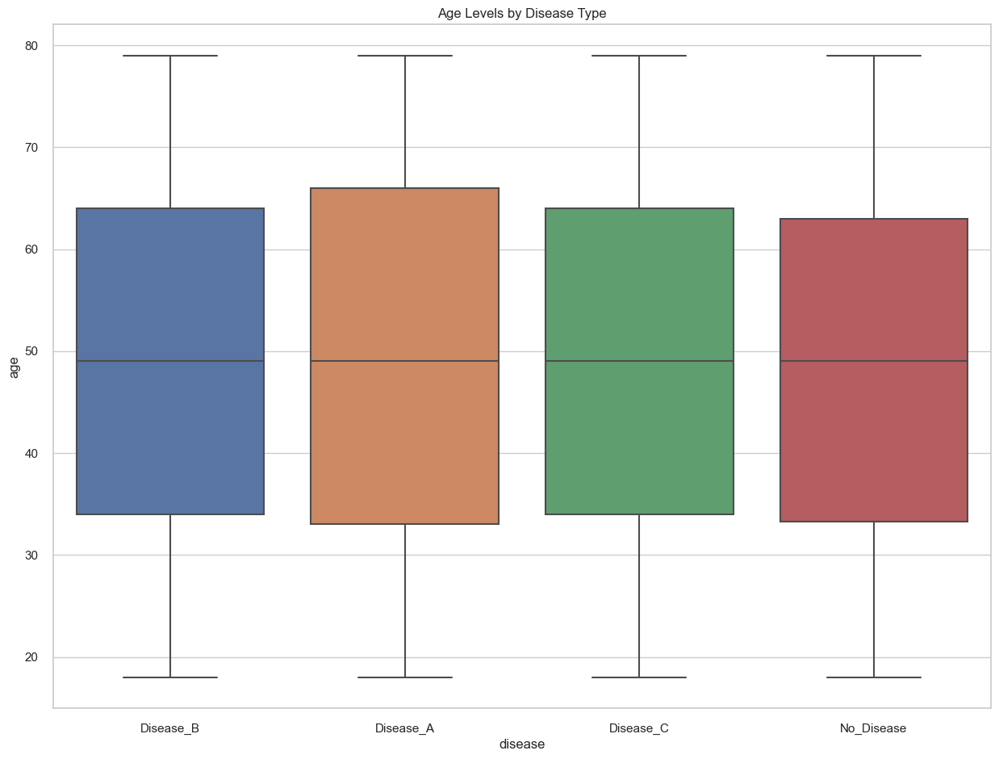

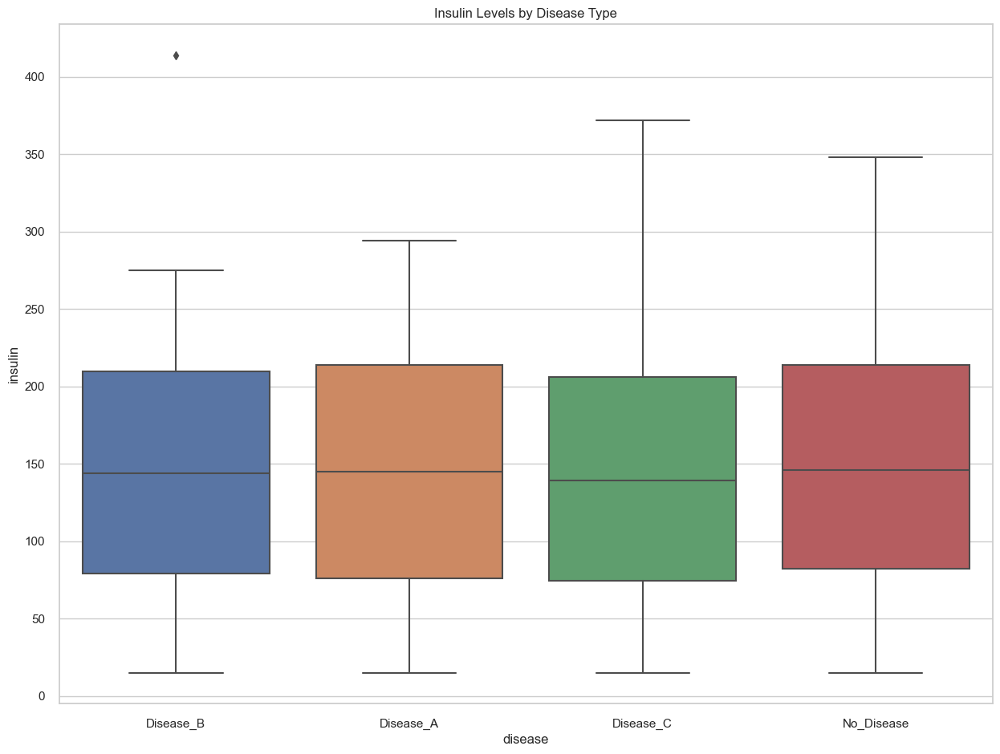

In [203]:
# Gonna start off with the funtion and then get the unique values of the independent variable
def perform_kruskal(dependent_var, independent_var, dataset):
    groups = dataset[independent_var].unique()
    #This loop performs the Levene's test for normality & prints the p value
    group_data = [dataset[dependent_var][dataset[independent_var] == group] for group in groups]
    levene_stat, levene_p = levene(*group_data, center='mean')
    print(f"Levene's test - p-value: {levene_p}")
    # This one does the Kruskal-Wallis test
    kruskal_stat, kruskal_p = kruskal(*group_data)
    print(f"Kruskal-Wallis test - p-value: {kruskal_p}")
    # This then interperets the results and lets us know if there's any significant difference between the groups
    if kruskal_p < 0.05:
        print(f"There is a significant difference in {dependent_var} between the groups (Kruskal-Wallis).")
    else:
        print(f"There is no significant difference in {dependent_var} between the groups (Kruskal-Wallis).")
    
    return pd.DataFrame({"Kruskal-Wallis p-value": [kruskal_p]})

# The metrics I want to test, my num_feats. The loop then conducts the Kruskal-Wallis test this time and prints the results
metrics = ['bmi', 'cholesterol', 'glucose', 'heart_rate', 'age', 'insulin']

# Here I'm conducting the Kruskal-Wallis test and printing the results again 
# but I do it before the function call so it's easier to read in the results
for metric in metrics:
    print(f"\nKruskal-Wallis test for {metric}:")
    test_results = perform_kruskal(dependent_var=metric, independent_var='disease', dataset=dataset)

# Here i did a simple visual of the results with boxplots
for metric in metrics:
    plt.figure(figsize=(15, 11))
    sns.boxplot(x='disease', y=metric, data=dataset)
    plt.title(f'{metric.capitalize()} Levels by Disease Type')
    plt.show()

## 3.3 Ttests

Slightly redundant now with the data not being normally distributed and the ANOVA test being useless, but I thought I might as well show that I know how to do t tests.

Shapiro-Wilk test for Disease_A: p-value = 6.319813037565424e-20
Shapiro-Wilk test for Disease_B: p-value = 3.384220258695591e-19


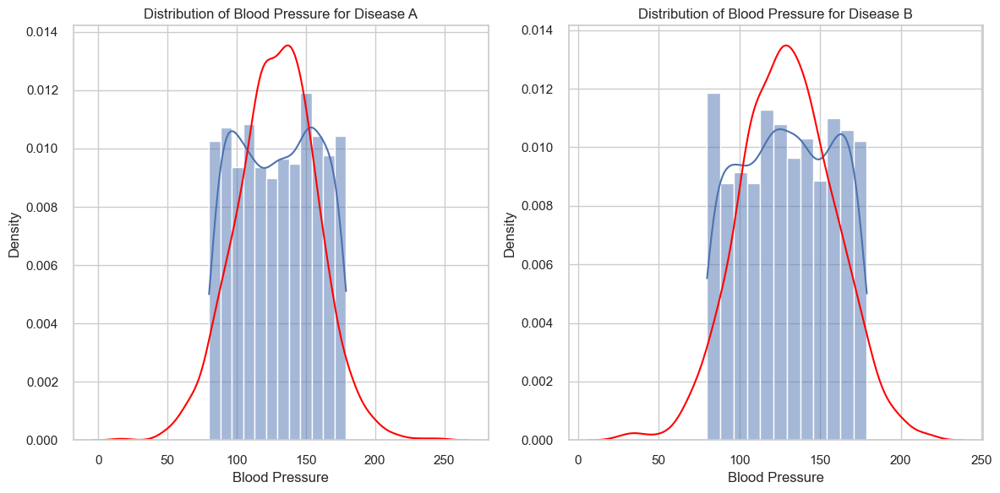

Independent t-test results: t-statistic = -0.026268206953863442, p-value = 0.9790455115279676
Fail to reject the null hypothesis: There is no significant difference in blood pressure between Disease_A and Disease_B.


In [204]:
# First of all I grouped my data of blood pressues of Disease A to Disease A, and of Disease B to Disease B
group_A = df_borrow[df_borrow['disease'] == 'Disease_A']['blood_pressure']
group_B = df_borrow[df_borrow['disease'] == 'Disease_B']['blood_pressure']
# Then I performed the Shapiro-Wilk test on the two new groups, before printing out the results
stat_A, p_A = shapiro(group_A)
stat_B, p_B = shapiro(group_B)
print(f'Shapiro-Wilk test for Disease_A: p-value = {p_A}')
print(f'Shapiro-Wilk test for Disease_B: p-value = {p_B}')

# Here is where I plot out a histogram of group A with it's KDE overlay in blue. 
# Then I added a red KDE plot of a normal distribution with the same mean and standard deviation as group_A for comparison.
# I used a tigh_layout() to automatically give the padding and prevent overlapping
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(group_A, kde=True, stat="density")
sns.kdeplot(norm.rvs(size=len(group_A), loc=group_A.mean(), scale=group_A.std()), color='red')
plt.title('Distribution of Blood Pressure for Disease A')
plt.xlabel('Blood Pressure')
# Just copy and pasted the same thing for Group B
plt.subplot(1, 2, 2)
sns.histplot(group_B, kde=True, stat="density")
sns.kdeplot(norm.rvs(size=len(group_B), loc=group_B.mean(), scale=group_B.std()), color='red')
plt.title('Distribution of Blood Pressure for Disease B')
plt.xlabel('Blood Pressure')
plt.tight_layout()
plt.show()
# I then performed an independent two-sample t-test comparing the means of the two groups, and printed it out
t_stat, p_value = ttest_ind(group_A, group_B)
print(f"Independent t-test results: t-statistic = {t_stat}, p-value = {p_value}")
# Here I set the significance level to the ddefault 0.05 and made it that if the p values to print out a rejectino of the null hypothesis
# and if not then vice versa.
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in blood pressure between Disease_A and Disease_B.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in blood pressure between Disease_A and Disease_B.")

I pretty much just copy and pasted my previous cell here but swapped out A & B for C & , so I won't waste your time by going over it again.

Shapiro-Wilk test for Disease_A: p-value = 8.918233298579748e-19
Shapiro-Wilk test for Disease_B: p-value = 2.2234480448575844e-19


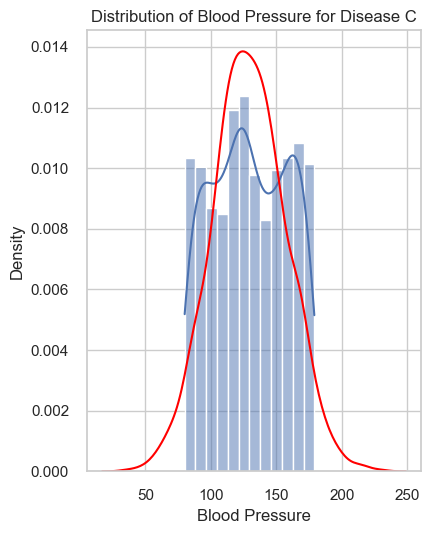

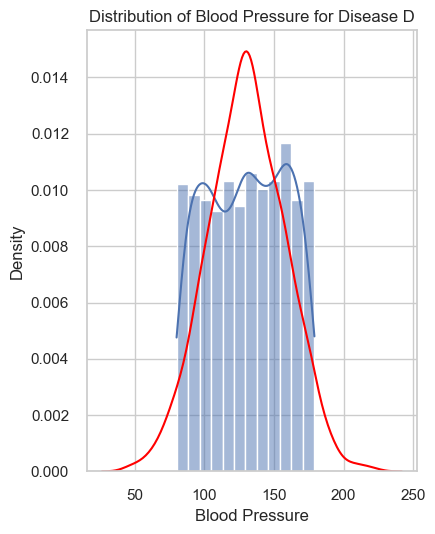

Independent t-test results: t-statistic = -0.3286470526789106, p-value = 0.7424500264383214
Fail to reject the null hypothesis: There is no significant difference in blood pressure between Disease C and Disease D.


In [205]:
group_C = df_borrow[df_borrow['disease'] == 'Disease_C']['blood_pressure']
group_D = df_borrow[df_borrow['disease'] == 'No_Disease']['blood_pressure']
stat_C, p_C = shapiro(group_C)
stat_D, p_D = shapiro(group_D)
print(f'Shapiro-Wilk test for Disease_A: p-value = {p_C}')
print(f'Shapiro-Wilk test for Disease_B: p-value = {p_D}')
plt.subplot(1, 2, 2)
sns.histplot(group_C, kde=True, stat="density")
sns.kdeplot(norm.rvs(size=len(group_C), loc=group_C.mean(), scale=group_C.std()), color='red')
plt.title('Distribution of Blood Pressure for Disease C')
plt.xlabel('Blood Pressure')
plt.tight_layout()
plt.show()
plt.subplot(1, 2, 2)
sns.histplot(group_D, kde=True, stat="density")
sns.kdeplot(norm.rvs(size=len(group_D), loc=group_D.mean(), scale=group_D.std()), color='red')
plt.title('Distribution of Blood Pressure for Disease D')
plt.xlabel('Blood Pressure')
plt.tight_layout()
plt.show()
t_stat, p_value = ttest_ind(group_C, group_D)
print(f"Independent t-test results: t-statistic = {t_stat}, p-value = {p_value}")
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in blood pressure between Disease C and Disease D.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in blood pressure between Disease C and Disease D.")

## 3.4 Mann Witney U Test

In [206]:
stat, p_value = mannwhitneyu(group_A, group_B)
print(f"Mann-Whitney U test results: U-statistic = {stat}, p-value = {p_value}")

alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in blood pressure between Disease_A and Disease_B.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in blood pressure between Disease_A and Disease_B.")

Mann-Whitney U test results: U-statistic = 780736.0, p-value = 0.9787116457171421
Fail to reject the null hypothesis: There is no significant difference in blood pressure between Disease_A and Disease_B.


Again there is no significant difference in blood pressure between Disease_A and Disease_B.

In [207]:
stat, p_value = mannwhitneyu(group_C, group_D)
print(f"Mann-Whitney U test results: U-statistic = {stat}, p-value = {p_value}")

alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in blood pressure between Disease_C and Disease_D.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in blood pressure between Disease_C and Disease_D.")

Mann-Whitney U test results: U-statistic = 775013.5, p-value = 0.7309830033501625
Fail to reject the null hypothesis: There is no significant difference in blood pressure between Disease_C and Disease_D.


And the same with C & D, there is no significant difference in blood pressure between Disease_C and Disease_D, either

## 3.5Chi-Square Test of Independence

           Feature 1 Feature 2      Chi2   p-value  Degrees of Freedom  \
0             smoker   disease  3.777560  0.286507                   3   
1         health_ins   disease  2.296884  0.513118                   3   
2  physical_activity   disease  2.552016  0.862601                   6   
3       income_level   disease  3.104516  0.795619                   6   
4       stress_level   disease  4.818008  0.567358                   6   

   Reject Null Hypothesis                               Expected Frequencies  
0                   False  [[608.0832, 615.9168, 608.0832, 615.9168], [63...  
1                   False  [[619.5096, 627.4904, 619.5096, 627.4904], [62...  
2                   False  [[406.134, 411.366, 406.134, 411.366], [401.66...  
3                   False  [[412.344, 417.656, 412.344, 417.656], [417.56...  
4                   False  [[403.8984, 409.1016, 403.8984, 409.1016], [42...  


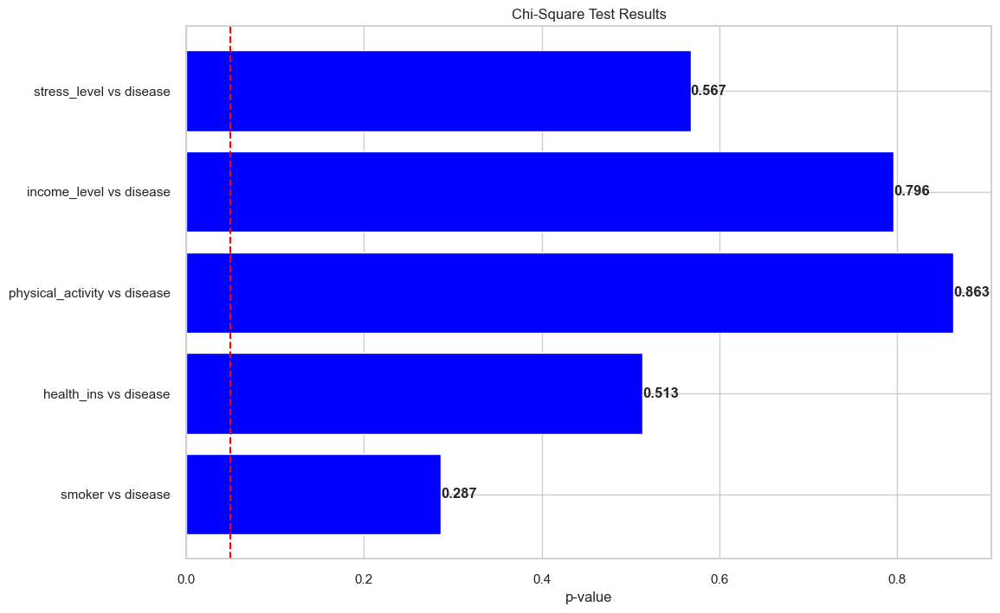

In [208]:
# I defined the functiono with my df and 'pairs'(which I'll define further down), and set up an empty 'results' to store stuff in later.
def chi_square_tests(df, pairs):
    results = []
    #This just loops through the pairs of columns
    for pair in pairs:
        # I check here to see if both columns actually exist or not in the DataFrame
        if pair[0] in df.columns and pair[1] in df.columns:
            # I then created a contingency table to show the frequency counts for the combinations of the categories
            contingency_table = pd.crosstab(df[pair[0]], df[pair[1]])
            
            # This is where I perform the actual Chi-Square Test
            chi2, p, dof, expected = chi2_contingency(contingency_table)
            # And store the results in the emplty box I set up earlier, the Chi2 statistic, p values etc.
            result = {
                'Feature 1': pair[0],
                'Feature 2': pair[1],
                'Chi2': chi2,
                'p-value': p,
                'Degrees of Freedom': dof,
                'Reject Null Hypothesis': p < 0.05,
                'Expected Frequencies': expected
            }
            # This then appends the dictionary to the results and prints a message if one or both columns in the pair do not exist
            results.append(result)
        else:
            print(f"Columns {pair[0]} or {pair[1]} do not exist in the DataFrame.")
        
    return pd.DataFrame(results)

# This is my list of tuples that I mentioned earlier
pairs = [
    ('smoker', 'disease'),
    ('health_ins', 'disease'),
    ('physical_activity', 'disease'),
    ('income_level', 'disease'),
    ('stress_level', 'disease')
]

# Perform Chi-Square tests on the provided DataFrame
results = chi_square_tests(df_borrow, pairs)
print(results)
# This is my functino to visualise the results
def visualize_chi_square_results(results):
    fig, ax1 = plt.subplots(figsize=(12, 8))
    
    # Plotting the p-values, and showing my alpha with a red line to see if/how far off, we are 
    ax1.barh(results['Feature 1'] + ' vs ' + results['Feature 2'], results['p-value'], color='blue')
    ax1.set_xlabel('p-value')
    ax1.set_title('Chi-Square Test Results')
    ax1.axvline(x=0.05, color='red', linestyle='--')
    
    # Adding the necessary text labels
    for i, (p, reject) in enumerate(zip(results['p-value'], results['Reject Null Hypothesis'])):
        ax1.text(p, i, f'{p:.3f}', ha='left', va='center', weight='bold')
    plt.show()

# This is to actually visualize the results
visualize_chi_square_results(results)

All the tests show a lack of any real  association between the pairs of categorical variables.

## 3.6 Correlation Analysis

This Is where I will do my Correlation Analysis, I chose to use another copy of the df for this section (df_corr) just to keep things clean and not as messy.

In the below code I define a function to label encode a dataset and then use that to label encode my first copy (df_borrow) and name that df_corr, which I can use throughout this section. I then run a .info() on the new df copy, just to make sure there aren't any issues with data types and null counts.

In [59]:
def label_encode_df(df):
    le = LabelEncoder()
    for column in df.columns:
        if df[column].dtype == 'object':
            df[column] = le.fit_transform(df[column])
    
    return df
df_corr = label_encode_df(df_borrow)
df_corr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   age                    5000 non-null   int64  
 1   bmi                    5000 non-null   float64
 2   blood_pressure         5000 non-null   float64
 3   cholesterol            5000 non-null   float64
 4   glucose                5000 non-null   float64
 5   insulin                5000 non-null   float64
 6   heart_rate             5000 non-null   float64
 7   smoker                 5000 non-null   int64  
 8   physical_activity      5000 non-null   int64  
 9   sleep_time             5000 non-null   int64  
 10  medical_history_score  5000 non-null   int64  
 11  income_level           5000 non-null   int64  
 12  stress_level           5000 non-null   int64  
 13  health_ins             5000 non-null   int64  
 14  disease                5000 non-null   int64  
dtypes: f

Here I'm checking to see how the dataset correlates with my disease feature, and then sorting all the values in descending 
(A.K.A ascending=False) order.

In [60]:
df_corr.corr()['disease'].sort_values(ascending=False)

disease                  1.000000
bmi                      0.031221
heart_rate               0.020138
insulin                  0.010566
income_level             0.006697
blood_pressure           0.005030
stress_level             0.004805
smoker                   0.002445
glucose                 -0.000142
physical_activity       -0.001928
health_ins              -0.006447
cholesterol             -0.007447
medical_history_score   -0.009550
age                     -0.015465
sleep_time              -0.021816
Name: disease, dtype: float64

Here I am plotting my df_corr data in descending order. I chose to remove the 'disease' column becuase when it is there it just dwarfs all the other data. I then plot the Correlation Coefficients with a bar plot horizontally, with the Set1 Palette again, and the data index as the y.

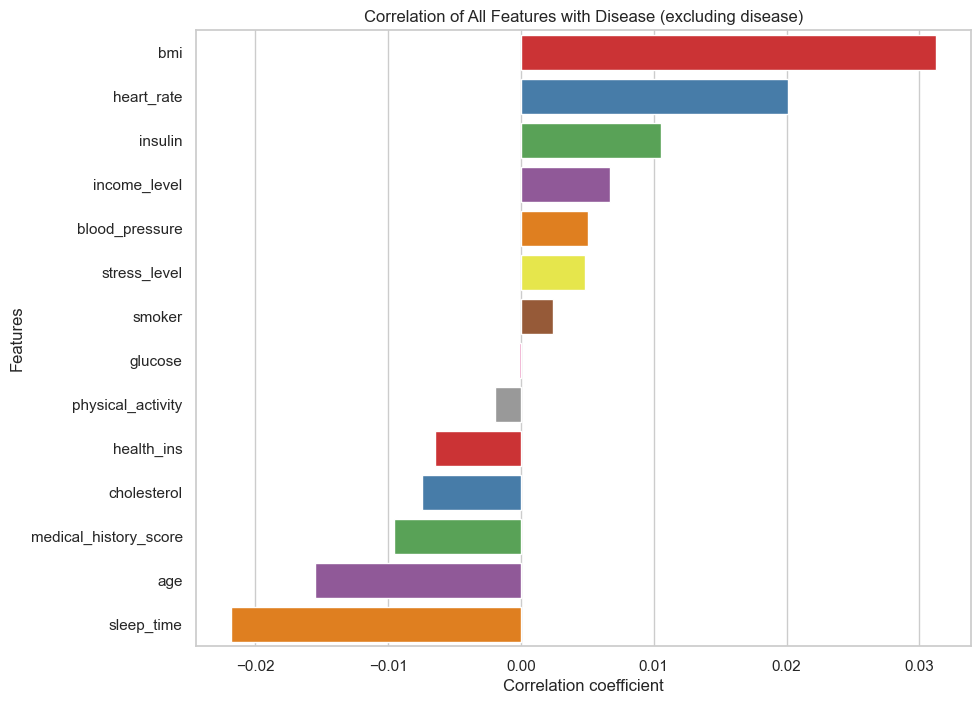

In [61]:
correlation_matrix = df_corr.corr()
disease_corr = correlation_matrix['disease'].sort_values(ascending=False)
disease_corr = disease_corr[disease_corr.index != 'disease']

plt.figure(figsize=(10, 8))
sns.barplot(x=disease_corr.values, y=disease_corr.index, palette="Set1")
plt.title('Correlation of All Features with Disease (excluding disease)')
plt.xlabel('Correlation coefficient')
plt.ylabel('Features')
plt.show()

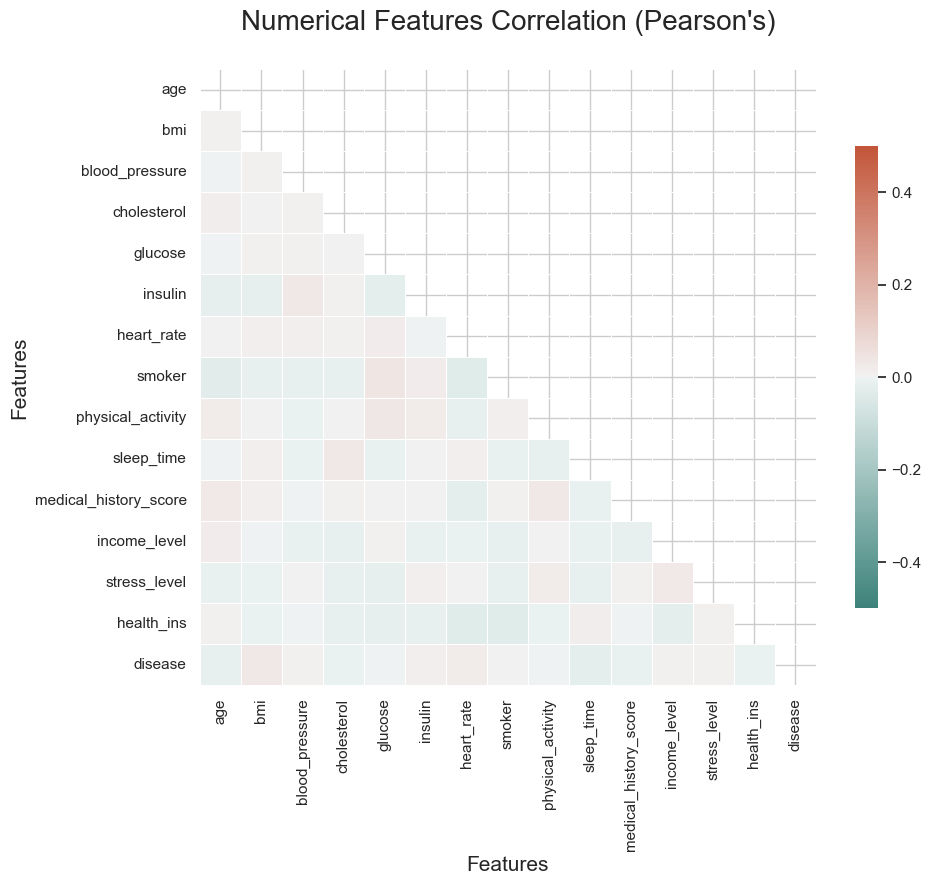

In [62]:
# I made sure to use my corr_data for the df and then actually create the correlation matrix using the Pearson Method
df = df_corr
corr = df.corr(method='pearson')
# I created a max which keeps true values above the diagonal and false values elsewhere, effectively hiding the upper half of the triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
# I then created a subplot with specified dimensions (10x8 inches) and no background color
f, ax = plt.subplots(figsize=(10, 8), facecolor=None)

# With such weak correlations I chose to just experiment with custom colours, to try find the biggest contrast as 'coolwarm' which I originally had
# was very hard to distnguish with.
cmap = sns.diverging_palette(180, 20, as_cmap=True)
# Theres a lot goin on here, but I just added the mask I created earlier, set the custom colour scale limits, centerd on zero for the least
# correlated, made the cells squares, set thin line widths, and reduced the colour bar.
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=0.5, vmin=-0.5, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": 0.75})

ax.set_title("Numerical Features Correlation (Pearson's)", fontsize=20, y=1.05)
plt.xlabel('Features', fontsize=15)
plt.ylabel('Features', fontsize=15)
plt.show()

# Machine Learning

For the Machine Learning method, I have split my section in two, to answer the two objective.
1 ) Supervised learning; I decided to use a new technoque I learned, to run multiple test on deafult parameters of multiple models at once testing accuracy, recall, precision, F1 and area under curve. This will show me which models are performing the best on the dataset. I will then explore the top three models and perform cross validation and paramater tuning.

1.5) I will also conduct PCA and LDA, to see if either process helps with classification and compare the two processes' results in my report.

2 ) Unsupervised learning; I will use an unsupervised model to create patient clusters, which I can then explore and try see if there is anything we can learn about them.

## 4.1 Supervised

I also had to install shap for this.

To begin with I had to create two functions, I will go through them below

In [64]:
# This function I used to create the actual confusion matrix, which creates a subplot and each classifier is fitted to the training data,
# a confusion matrix is plotted for the validation set on a subplot axis and the title of each subplot is set to the corresponding classifier 
# name.
def plot_conf_matrix(names, classifiers, nrows, ncols, fig_a, fig_b):
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(fig_a, fig_b))
    i = 0
    for clf, ax in zip(classifiers, axes.flatten()):
        clf.fit(X_train, y_train)
        plot_confusion_matrix(clf, X_val, y_val, ax=ax)
        ax.title.set_text(names[i])
        i = i + 1       
    plt.tight_layout() 
    plt.show()
# I'm using this function to generate and display ROC curves for multiple classifiers, 
# showing their performance in distinguishing between classes, each ROC curve includes the classifier's 
# name and ROC AUC score for easy comparison
def roc_auc_curve(names, classifiers):   
    plt.figure(figsize=(12, 8))   
    for name, clf in zip(names, classifiers):
        clf.fit(X_train, y_train)
        pred_proba = clf.predict_proba(X_val)[:, 1]
        fpr, tpr, thresholds = roc_curve(y_val, pred_proba)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=3, label= name +' ROC curve (area = %0.2f)' % (roc_auc))
        plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.0])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver operating characteristic (ROC) curves', fontsize=20)
        plt.legend(loc="lower right")

In [65]:
 # I first made a label encoder like the one I had in the Statistical Analysis section but this time for my cat_feats.
def label_encode_cat_features(df, cat_features):
    for feature in cat_features:
        le = LabelEncoder()
        df[feature] = le.fit_transform(df[feature])
    return df
# I'm using my original df and setting my cat_feats before label encoding them 
df = pd.DataFrame(df)
cat_feats = ['disease', 'smoker', 'health_ins','physical_activity', 'income_level', 'stress_level',]
df = label_encode_cat_features(df, cat_feats)
# I'm splitting my X and y variables and then split testing
X = df.drop('disease', axis=1)
y = df['disease']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=0)
# I'm setting the seed to 0 now, so I dont havt to keep putting random_state=0 for each classifier
seed=0

# Laying down the classifer names
names = [
    'Logistic Regression',
    'Nearest Neighbors',
    'Support Vectors',
    'Decision Tree',
    'Random Forest',
    'AdaBoost',
    'Gradient Boosting',
    'Naive Bayes',
    'Quadratic DA',
    "Neural Net"
]
# Creating my classifiers and setting their random state to the previously defined seed so my results can be replicated
classifiers = [
  LogisticRegression(solver="liblinear", random_state=seed),
    KNeighborsClassifier(2),
    SVC(probability=True, random_state=seed),
    DecisionTreeClassifier(random_state=seed),
    RandomForestClassifier(random_state=seed),
    AdaBoostClassifier(random_state=seed),
    GradientBoostingClassifier(random_state=seed),
    GaussianNB(),  
    QuadraticDiscriminantAnalysis(),
    MLPClassifier(random_state=seed),
]
# This is the function to run my data on all the layed down classifiers. For each classifier I get them to:
# - Fit the classifier to the training data
# - predict on the validation set
# - calculate performance metrics: accuracy, recall, precision, F1 score, and ROC AUC
# - append the results to the list results
# I also added in an exception clause to return the error with the classifier name and and append NaN values for the broken model
def score_summary(names, classifiers):
    results = []
    for name, clf in zip(names, classifiers):
        try:
            clf.fit(X_train, y_train)
            pred = clf.predict(X_val)
            
            accuracy = accuracy_score(y_val, pred)
            recall = recall_score(y_val, pred, average='macro')
            precision = precision_score(y_val, pred, average='macro')
            f1 = f1_score(y_val, pred, average='macro')
            
            roc_auc = float('nan')
            if hasattr(clf, "predict_proba"):
                pred_proba = clf.predict_proba(X_val)
                if pred_proba.shape[1] == len(np.unique(y)):  
                    roc_auc = roc_auc_score(y_val, pred_proba, multi_class='ovr', average='macro')
            
            results.append({
                'Classifier': name,
                'Accuracy': accuracy,
                'Recall': recall,
                'Precision': precision,
                'F1': f1,
                'ROC_AUC': roc_auc
            })
        except Exception as e:
            print(f"Error with classifier {name}: {e}")
            results.append({
                'Classifier': name,
                'Accuracy': float('nan'),
                'Recall': float('nan'),
                'Precision': float('nan'),
                'F1': float('nan'),
                'ROC_AUC': float('nan')
            })
    
    return pd.DataFrame(results)
# This is the summary of all the results collected so far. It should be a grid in descending order of accuracy, The colour map is set to
# coolwarm for visualisations sake on Accuracy too, the other bars are given their own colour.
summary = score_summary(names, classifiers)
summary = summary.sort_values(by='Accuracy', ascending=False)

styled_summary = summary.style.background_gradient(cmap='coolwarm', subset=['Accuracy'])\
    .bar(subset=["ROC_AUC"], color='#6495ED')\
    .bar(subset=["Recall"], color='#ff355d')\
    .bar(subset=["Precision"], color='lightseagreen')\
    .bar(subset=["F1"], color='gold')

styled_summary

,Classifier,Accuracy,Recall,Precision,F1,ROC_AUC
5,AdaBoost,0.260800,0.260468,0.260685,0.260121,0.489567
8,Quadratic DA,0.259200,0.258996,0.258544,0.258750,0.507432
9,Neural Net,0.258400,0.257952,0.249385,0.217012,0.500998
2,Support Vectors,0.256000,0.254354,0.257012,0.235341,0.493479
3,Decision Tree,0.252800,0.252478,0.252904,0.252607,0.501717
0,Logistic Regression,0.252000,0.252189,0.251413,0.251115,0.476008
7,Naive Bayes,0.249600,0.249681,0.250324,0.249553,0.477174
6,Gradient Boosting,0.248800,0.248892,0.250295,0.249374,0.492545
1,Nearest Neighbors,0.241600,0.241937,0.253439,0.222490,0.504392
4,Random Forest,0.227200,0.227130,0.226853,0.226882,0.489722


As you can see, AdaBoost, QDA and Neural Net performed the best but 25-26% accuracy is very bad for classifier results.

In [66]:
df

,age,bmi,blood_pressure,cholesterol,glucose,insulin,heart_rate,smoker,physical_activity,sleep_time,medical_history_score,income_level,stress_level,health_ins,disease
0,56,27.577099,88.0,108.0,92.0,171.0,75.0,0,2,9,5,0,1,0,1
1,69,26.233744,88.0,252.0,102.0,179.0,71.0,0,0,9,3,0,2,1,0
2,46,29.646620,152.0,141.0,89.0,198.0,90.0,1,1,5,5,2,2,0,2
3,32,30.619597,106.0,273.0,159.0,222.0,64.0,1,2,7,0,2,0,0,2
4,60,16.794395,96.0,172.0,173.0,30.0,99.0,1,1,7,3,0,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,42,32.859689,174.0,140.0,107.0,248.0,90.0,1,0,10,9,0,0,0,1
4996,39,37.916078,113.0,184.0,180.0,200.0,98.0,1,0,8,5,0,1,0,2
4997,48,32.637416,143.0,188.0,82.0,77.0,61.0,1,0,4,1,2,0,1,2
4998,34,31.794482,108.0,141.0,76.0,117.0,71.0,1,0,4,2,1,2,0,3


I can see now that my df has changed to label encoded results, which is fine, but just important to keep in mind.

## 4.2 Ada Boost

Now to perform tests on my first model, I will conduct a grid search to find the best hyper parameters, conduct the test with those parameters and will use k-fold (10/20/30) cross validation. I decided to use a DT as my base estimator

I will then create a model to run all of this in one go on 5 different splits.

In [67]:
X = df.drop('disease', axis=1)
y = df['disease']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=0)

In [68]:
param_grid = {
   'n_estimators': [10, 50],
    'learning_rate': [0.01, 0.1],
    'estimator__max_depth': [3, 4, 5],
    'estimator__min_samples_split': [5, 10, 20],
    'estimator__min_samples_leaf': [5, 10, 20]
}

base_estimator = DecisionTreeClassifier(random_state=0)
ada_boost = AdaBoostClassifier(estimator=base_estimator, algorithm='SAMME', random_state=0)

grid_search = GridSearchCV(estimator=ada_boost, param_grid=param_grid, cv=5, scoring='accuracy', verbose=2, n_jobs=-1)
grid_search.fit(X_train, y_train)

print("Best parameters found: ", grid_search.best_params_)
print("Best score achieved: ", grid_search.best_score_)

best_ada_boost = grid_search.best_estimator_
y_pred = best_ada_boost.predict(X_val)

conf_matrix = confusion_matrix(y_val, y_pred)
class_report = classification_report(y_val, y_pred)

print(f"Accuracy on training set: {best_ada_boost.score(X_train, y_train):.3f}")
print(f"Accuracy on validation set: {best_ada_boost.score(X_val, y_val):.3f}")
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

Fitting 5 folds for each of 108 candidates, totalling 540 fits
Best parameters found:  {'estimator__max_depth': 4, 'estimator__min_samples_leaf': 5, 'estimator__min_samples_split': 5, 'learning_rate': 0.1, 'n_estimators': 50}
Best score achieved:  0.2554666666666667
Accuracy on training set: 0.378
Accuracy on validation set: 0.241
Confusion Matrix:
[[ 74  71  69  95]
 [ 61  65  83 109]
 [ 74  63  80  92]
 [ 83  70  79  82]]

Classification Report:
              precision    recall  f1-score   support

           0       0.25      0.24      0.25       309
           1       0.24      0.20      0.22       318
           2       0.26      0.26      0.26       309
           3       0.22      0.26      0.24       314

    accuracy                           0.24      1250
   macro avg       0.24      0.24      0.24      1250
weighted avg       0.24      0.24      0.24      1250



After Finding the best params I am going to use them on my model, and print out the metrics of how it performed with the training and testing accuracy, confusion matrix and classification report. Theres some major overfitting so I am going to prune my tree a little bit.

In [69]:
best_params = grid_search.best_params_

base_estimator = DecisionTreeClassifier(max_depth=best_params['estimator__max_depth'], 
                                        min_samples_split=best_params['estimator__min_samples_split'], 
                                        min_samples_leaf=best_params['estimator__min_samples_leaf'], 
                                        random_state=0)

ada_boost = AdaBoostClassifier(estimator=base_estimator, 
                               n_estimators=best_params['n_estimators'], 
                               learning_rate=best_params['learning_rate'], 
                               algorithm='SAMME', 
                               random_state=0)

ada_boost.fit(X_train, y_train)
y_pred = ada_boost.predict(X_val)

conf_matrix = confusion_matrix(y_val, y_pred)
class_report = classification_report(y_val, y_pred)
print(f"Accuracy on training set: {ada_boost.score(X_train, y_train):.3f}")
print(f"Accuracy on validation set: {ada_boost.score(X_val, y_val):.3f}")
print("Confusion Matrix:")
print(conf_matrix)
print("\nClassification Report:")
print(class_report)

Accuracy on training set: 0.378
Accuracy on validation set: 0.241
Confusion Matrix:
[[ 74  71  69  95]
 [ 61  65  83 109]
 [ 74  63  80  92]
 [ 83  70  79  82]]

Classification Report:
              precision    recall  f1-score   support

           0       0.25      0.24      0.25       309
           1       0.24      0.20      0.22       318
           2       0.26      0.26      0.26       309
           3       0.22      0.26      0.24       314

    accuracy                           0.24      1250
   macro avg       0.24      0.24      0.24      1250
weighted avg       0.24      0.24      0.24      1250



I am going to perform a k fold cross validation with 10, 20 and 30 folds as required in the brief.

In [70]:
def k_fold_cross_validation(k, model, X, y):
    kf = KFold(n_splits=k, shuffle=True, random_state=0)
    accuracies = cross_val_score(model, X, y, cv=kf, scoring='accuracy')
    y_pred = cross_val_predict(model, X, y, cv=kf)
    conf_matrix = confusion_matrix(y, y_pred)
    class_report = classification_report(y, y_pred)
    
    print(f"\nK-Fold Cross-Validation with k={k}")
    print(f"Mean Accuracy: {np.mean(accuracies):.3f}")
    print("Confusion Matrix:")
    print(conf_matrix)
    print("\nClassification Report:")
    print(class_report)
k_fold_cross_validation(10, ada_boost, X, y)
k_fold_cross_validation(20, ada_boost, X, y)
k_fold_cross_validation(30, ada_boost, X, y)


K-Fold Cross-Validation with k=10
Mean Accuracy: 0.240
Confusion Matrix:
[[260 255 274 453]
 [283 234 281 460]
 [251 262 261 468]
 [302 283 226 447]]

Classification Report:
              precision    recall  f1-score   support

           0       0.24      0.21      0.22      1242
           1       0.23      0.19      0.20      1258
           2       0.25      0.21      0.23      1242
           3       0.24      0.36      0.29      1258

    accuracy                           0.24      5000
   macro avg       0.24      0.24      0.24      5000
weighted avg       0.24      0.24      0.24      5000


K-Fold Cross-Validation with k=20
Mean Accuracy: 0.246
Confusion Matrix:
[[260 256 253 473]
 [287 235 271 465]
 [260 246 253 483]
 [271 276 230 481]]

Classification Report:
              precision    recall  f1-score   support

           0       0.24      0.21      0.22      1242
           1       0.23      0.19      0.21      1258
           2       0.25      0.20      0.22      124

The brief asked me to perform with multiple splits, so I am going to write code to do everything we've done so far but at once and in a more automated way with function to run the tests on each split one after another in one go. I will walk you through it below.

In [71]:
# I started this off with creating a k_fold_cross_validation function which I'll use at the end of the cell.
def k_fold_cross_validation(k, model, X, y):
    kf = KFold(n_splits=k, shuffle=True, random_state=0)
    accuracies = cross_val_score(model, X, y, cv=kf, scoring='accuracy')
    y_pred = cross_val_predict(model, X, y, cv=kf)
    
    conf_matrix = confusion_matrix(y, y_pred)
    class_report = classification_report(y, y_pred)
    
    print(f"\nK-Fold Cross-Validation with k={k}")
    print(f"Mean Accuracy: {np.mean(accuracies):.3f}")
    print("Confusion Matrix:")
    print(conf_matrix)
    print("\nClassification Report:")
    print(class_report)

# This function evaluates the models like in the previous example and then runs the k_fold_cross_validation function on 10, 20 and 30 folds,
# its basically the previous 3 parts squashed together.
def evaluate_model_splits(X, y, test_sizes):
    param_grid = {
        'n_estimators': [50, 100],
        'learning_rate': [0.01, 0.1, 1],
        'estimator__max_depth': [4, 6, 8],
        'estimator__min_samples_split': [10, 20],
        'estimator__min_samples_leaf': [5, 10]
    }
    
    for test_size in test_sizes:
        print(f"\nTrain-Validation Split with test_size={test_size}")
        
        X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, random_state=0)
        
        base_estimator = DecisionTreeClassifier(random_state=0)
        ada_boost = AdaBoostClassifier(estimator=base_estimator, algorithm='SAMME', random_state=0)
        
        grid_search = GridSearchCV(estimator=ada_boost, param_grid=param_grid, cv=5, n_jobs=-1, scoring='accuracy', verbose=2)
        grid_search.fit(X_train, y_train)
        
        print("Best parameters found: ", grid_search.best_params_)
        print("Best score achieved: ", grid_search.best_score_)
        
        best_ada_boost = grid_search.best_estimator_
        y_pred = best_ada_boost.predict(X_val)
        
        conf_matrix = confusion_matrix(y_val, y_pred)
        class_report = classification_report(y_val, y_pred)
        
        print(f"Accuracy on training set: {best_ada_boost.score(X_train, y_train):.3f}")
        print(f"Accuracy on validation set: {best_ada_boost.score(X_val, y_val):.3f}")
        
        print("Confusion Matrix:")
        print(conf_matrix)
        print("\nClassification Report:")
        print(class_report)
        
        k_fold_cross_validation(10, best_ada_boost, X, y)
        k_fold_cross_validation(20, best_ada_boost, X, y)
        k_fold_cross_validation(30, best_ada_boost, X, y)

# Here is where I split the X and y 
X = df.drop('disease', axis=1)
y = df['disease']

# And these two little lines are why we did all the previous coding. 
# This essentially runs the chosen X and y variables through all that code but by 5 different testing splits,
# and gives us our results in order
test_sizes = [0.2, 0.25, 0.3, 0.35, 0.4]
evaluate_model_splits(X, y, test_sizes)


Train-Validation Split with test_size=0.2
Fitting 5 folds for each of 72 candidates, totalling 360 fits
Best parameters found:  {'estimator__max_depth': 8, 'estimator__min_samples_leaf': 5, 'estimator__min_samples_split': 20, 'learning_rate': 1, 'n_estimators': 50}
Best score achieved:  0.26425
Accuracy on training set: 0.971
Accuracy on validation set: 0.251
Confusion Matrix:
[[56 65 63 63]
 [63 76 53 61]
 [54 79 63 55]
 [63 64 66 56]]

Classification Report:
              precision    recall  f1-score   support

           0       0.24      0.23      0.23       247
           1       0.27      0.30      0.28       253
           2       0.26      0.25      0.25       251
           3       0.24      0.22      0.23       249

    accuracy                           0.25      1000
   macro avg       0.25      0.25      0.25      1000
weighted avg       0.25      0.25      0.25      1000


K-Fold Cross-Validation with k=10
Mean Accuracy: 0.255
Confusion Matrix:
[[274 304 318 346]
 [302 

## 4.3 Quadratic Discriminant Analysis

In [72]:
def k_fold_cross_validation(k, model, X, y):
    kf = KFold(n_splits=k, shuffle=True, random_state=0)
    accuracies = cross_val_score(model, X, y, cv=kf, scoring='accuracy')
    y_pred = cross_val_predict(model, X, y, cv=kf)
    
    conf_matrix = confusion_matrix(y, y_pred)
    class_report = classification_report(y, y_pred)
    
    print(f"\nK-Fold Cross-Validation with k={k}")
    print(f"Mean Accuracy: {np.mean(accuracies):.3f}")
    print("Confusion Matrix:")
    print(conf_matrix)
    print("\nClassification Report:")
    print(class_report)

# Param Changes 
def evaluate_model_splits(X, y, test_sizes):
    param_grid = {
        'reg_param': [0.0, 0.01, 0.1, 0.5, 1.0]
    }
    
    for test_size in test_sizes:
        print(f"\nTrain-Validation Split with test_size={test_size}")
        
        X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, random_state=0)
        
        qda = QDA()
        grid_search = GridSearchCV(estimator=qda, param_grid=param_grid, cv=5, n_jobs=-1, scoring='accuracy', verbose=2)
        grid_search.fit(X_train, y_train)
        
        print("Best parameters found: ", grid_search.best_params_)
        print("Best score achieved: ", grid_search.best_score_)
        
        best_qda = grid_search.best_estimator_
        y_pred = best_qda.predict(X_val)
        
        conf_matrix = confusion_matrix(y_val, y_pred)
        class_report = classification_report(y_val, y_pred)
        
        print(f"Accuracy on training set: {best_qda.score(X_train, y_train):.3f}")
        print(f"Accuracy on validation set: {best_qda.score(X_val, y_val):.3f}")
        
        print("Confusion Matrix:")
        print(conf_matrix)
        print("\nClassification Report:")
        print(class_report)
        
        k_fold_cross_validation(10, best_qda, X, y)
        k_fold_cross_validation(20, best_qda, X, y)
        k_fold_cross_validation(30, best_qda, X, y)

X = df.drop('disease', axis=1)
y = df['disease']

test_sizes = [0.2, 0.25, 0.3, 0.35, 0.4]
evaluate_model_splits(X, y, test_sizes)


Train-Validation Split with test_size=0.2
Fitting 5 folds for each of 5 candidates, totalling 25 fits
Best parameters found:  {'reg_param': 0.0}
Best score achieved:  0.26450000000000007
Accuracy on training set: 0.352
Accuracy on validation set: 0.260
Confusion Matrix:
[[52 61 69 65]
 [59 77 53 64]
 [65 62 63 61]
 [61 61 59 68]]

Classification Report:
              precision    recall  f1-score   support

           0       0.22      0.21      0.21       247
           1       0.30      0.30      0.30       253
           2       0.26      0.25      0.25       251
           3       0.26      0.27      0.27       249

    accuracy                           0.26      1000
   macro avg       0.26      0.26      0.26      1000
weighted avg       0.26      0.26      0.26      1000


K-Fold Cross-Validation with k=10
Mean Accuracy: 0.260
Confusion Matrix:
[[255 328 335 324]
 [270 356 332 300]
 [293 313 344 292]
 [281 323 310 344]]

Classification Report:
              precision    recall

Next up I copy the same thing again but this time for Neural Net, so I have to actually include the model with a functio

## 4.4 Neural Net

In [86]:
pip install scikeras

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.0/11.0 MB 45.2 MB/s eta 0:00:00 0:00:01
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.4.1.post1
    Uninstalling scikit-learn-1.4.1.post1:
      Successfully uninstalled scikit-learn-1.4.1.post1
Note: you may need to restart the kernel to use updated packages.


In [216]:
le = LabelEncoder()

# Apply label encoding to all columns
df_encoded = df.apply(lambda col: le.fit_transform(col.astype(str)) if col.dtype == 'object' else col)

df=df_encoded
df

,age,bmi,blood_pressure,cholesterol,glucose,insulin,heart_rate,smoker,physical_activity,sleep_time,medical_history_score,income_level,stress_level,health_ins,disease
0,56,27.577099,88.0,108.0,92.0,171.0,75.0,0,2,9,5,0,1,0,1
1,69,26.233744,88.0,252.0,102.0,179.0,71.0,0,0,9,3,0,2,1,0
2,46,29.646620,152.0,141.0,89.0,198.0,90.0,1,1,5,5,2,2,0,2
3,32,30.619597,106.0,273.0,159.0,222.0,64.0,1,2,7,0,2,0,0,2
4,60,16.794395,96.0,172.0,173.0,30.0,99.0,1,1,7,3,0,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,42,32.859689,174.0,140.0,107.0,248.0,90.0,1,0,10,9,0,0,0,1
4996,39,37.916078,113.0,184.0,180.0,200.0,98.0,1,0,8,5,0,1,0,2
4997,48,32.637416,143.0,188.0,82.0,77.0,61.0,1,0,4,1,2,0,1,2
4998,34,31.794482,108.0,141.0,76.0,117.0,71.0,1,0,4,2,1,2,0,3


In [228]:
# I actually had to create a function to create the neural network model for this one
def create_model(learning_rate=0.01, input_dim=None, num_classes=None):
    model = Sequential()
    model.add(Dense(32, input_dim=input_dim, activation='relu'))
    model.add(Dense(16, activation='relu'))
    model.add(Dense(num_classes, activation='softmax'))
    optimizer = Adam(learning_rate=learning_rate)
    model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return model

def k_fold_cross_validation(k, model, X, y):
    kf = StratifiedKFold(n_splits=k, shuffle=True, random_state=0)
    accuracies = cross_val_score(model, X, y, cv=kf, scoring='accuracy')
    y_pred = cross_val_predict(model, X, y, cv=kf)
    
    conf_matrix = confusion_matrix(y, y_pred)
    class_report = classification_report(y, y_pred)
    
    print(f"\nK-Fold Cross-Validation with k={k}")
    print(f"Mean Accuracy: {np.mean(accuracies):.3f}")
    print("Confusion Matrix:")
    print(conf_matrix)
    print("\nClassification Report:")
    print(class_report)

def evaluate_model_splits(X, y, test_sizes):
    param_grid = {
        'batch_size': [10, 20],
        'epochs': [50, 100],
        'model__learning_rate': [0.001, 0.01, 0.1]
    }
    
    for test_size in test_sizes:
        print(f"\nTrain-Validation Split with test_size={test_size}")
        
        X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=test_size, random_state=0, stratify=y)
        
        input_dim = X_train.shape[1]
        num_classes = len(np.unique(y_train))
        
        model = KerasClassifier(model=create_model, input_dim=input_dim, num_classes=num_classes, verbose=0)
        grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=5, scoring='accuracy', verbose=2)
        grid_search.fit(X_train, y_train)
        
        print("Best parameters found: ", grid_search.best_params_)
        print("Best score achieved: ", grid_search.best_score_)
        
        best_model = grid_search.best_estimator_
        y_pred = best_model.predict(X_val)

        conf_matrix = confusion_matrix(y_val, y_pred)
        class_report = classification_report(y_val, y_pred)
        
        print(f"Accuracy on training set: {best_model.score(X_train, y_train):.3f}")
        print(f"Accuracy on validation set: {best_model.score(X_val, y_val):.3f}")
        
        print("Confusion Matrix:")
        print(conf_matrix)
        print("\nClassification Report:")
        print(class_report)
        
        k_fold_cross_validation(10, best_model, X_train, y_train)
        k_fold_cross_validation(20, best_model, X_train, y_train)
        k_fold_cross_validation(30, best_model, X_train, y_train)

X = df.drop('disease', axis=1)
y = df['disease']

test_sizes = [0.2, 0.25, 0.3, 0.35, 0.4]
evaluate_model_splits(X, y, test_sizes)


Train-Validation Split with test_size=0.2
Fitting 5 folds for each of 12 candidates, totalling 60 fits
[CV] END batch_size=10, epochs=50, model__learning_rate=0.001; total time=   3.5s
[CV] END batch_size=10, epochs=50, model__learning_rate=0.001; total time=   3.5s
[CV] END batch_size=10, epochs=50, model__learning_rate=0.001; total time=   3.5s
[CV] END batch_size=10, epochs=50, model__learning_rate=0.001; total time=   3.4s
[CV] END batch_size=10, epochs=50, model__learning_rate=0.001; total time=   3.5s
[CV] END batch_size=10, epochs=50, model__learning_rate=0.01; total time=   3.4s
[CV] END batch_size=10, epochs=50, model__learning_rate=0.01; total time=   3.4s
[CV] END batch_size=10, epochs=50, model__learning_rate=0.01; total time=   3.4s
[CV] END batch_size=10, epochs=50, model__learning_rate=0.01; total time=   3.4s
[CV] END batch_size=10, epochs=50, model__learning_rate=0.01; total time=   3.4s
[CV] END .batch_size=10, epochs=50, model__learning_rate=0.1; total time=   3.5s


In [221]:
y.shape

(5000,)

# PCA vs LDA

In this next section I will be conducting PCA and LDA on my data and then running the previously used classifiers on them to see how they compare to eachother, and how they compare to the original data post-cleaning

## 5.1 PCA

Note that df is now label encoded from the previous section,

This cell just takes our dependant variables and plots the cumulative variance which we will need in the following cell. I had to run it once, to see where it reaches 1 on the y axis before going back and adding in the red axhline at the right point. But you could create a function to automatically do that for larger projects if need be.

In [90]:
label_encoder = LabelEncoder()
for column in df.select_dtypes(include=['object']).columns:
    df[column] = label_encoder.fit_transform(df[column])
df

,age,bmi,blood_pressure,cholesterol,glucose,insulin,heart_rate,smoker,physical_activity,sleep_time,medical_history_score,income_level,stress_level,health_ins,disease
0,56,27.577099,88.0,108.0,92.0,171.0,75.0,0,2,9,5,0,1,0,1
1,69,26.233744,88.0,252.0,102.0,179.0,71.0,0,0,9,3,0,2,1,0
2,46,29.646620,152.0,141.0,89.0,198.0,90.0,1,1,5,5,2,2,0,2
3,32,30.619597,106.0,273.0,159.0,222.0,64.0,1,2,7,0,2,0,0,2
4,60,16.794395,96.0,172.0,173.0,30.0,99.0,1,1,7,3,0,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,42,32.859689,174.0,140.0,107.0,248.0,90.0,1,0,10,9,0,0,0,1
4996,39,37.916078,113.0,184.0,180.0,200.0,98.0,1,0,8,5,0,1,0,2
4997,48,32.637416,143.0,188.0,82.0,77.0,61.0,1,0,4,1,2,0,1,2
4998,34,31.794482,108.0,141.0,76.0,117.0,71.0,1,0,4,2,1,2,0,3


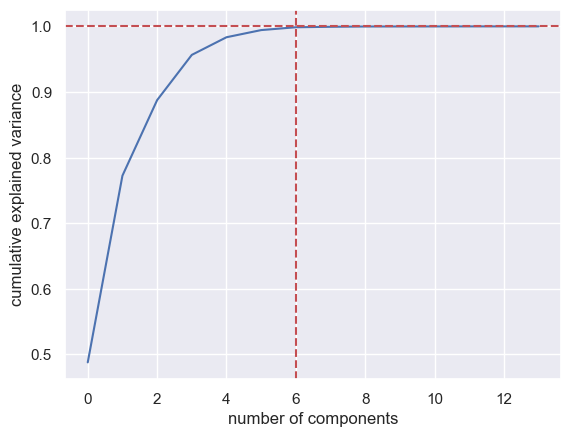

In [93]:
df_no_target = df.drop(columns=["disease"])
pca = PCA().fit(df_no_target) 
plt.plot(np.cumsum(pca.explained_variance_ratio_)) 
plt.axvline(x=6, color='r', linestyle='--')
plt.axhline(y=1, color='r', linestyle='--')
plt.xlabel('number of components') 
plt.ylabel('cumulative explained variance'); 

I used the previous cumsum graph to know I need to use the first six principle components in my pca, I then fit and transformed the model

In [98]:
pca = PCA(6)
projected = pca.fit_transform(df_no_target)

In [99]:
projected.shape

(5000, 6)

I'm now adding the disease/target column onto our six prcinicple components and calling it all our target_pca dataframe

In [100]:
target_pca = pd.DataFrame(projected, columns =['C1', 'C2', 'C3', 'C4','C5', 'C6'])
target_pca["disease"] = df['disease']
target_pca.head()

,C1,C2,C3,C4,C5,C6,disease
0,25.339911,92.313064,-42.775827,41.070585,-7.708615,-4.073104,1
1,35.080703,-51.653715,-33.177070,42.014761,-20.048166,-8.279469,0
2,53.692139,59.432849,-44.535256,-22.511649,2.302988,10.660392,2
3,78.035024,-72.158087,24.558129,25.535116,16.796027,-15.512382,2
4,-115.690867,26.097114,36.476937,32.539744,-10.867978,19.233233,1


I check the dataframe with the info() method and see that there's some missing samples in our target row. Becuase it's our target row I can't impute or fill them as that would tamper with results, so I just drop all the rows with missing data in the disease feature. 

In [101]:
target_pca.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   C1       5000 non-null   float64
 1   C2       5000 non-null   float64
 2   C3       5000 non-null   float64
 3   C4       5000 non-null   float64
 4   C5       5000 non-null   float64
 5   C6       5000 non-null   float64
 6   disease  5000 non-null   int64  
dtypes: float64(6), int64(1)
memory usage: 273.6 KB


This attribute is just a way to see the amount of variance explained by each of the selected principal components, but in a neater format that if i just used the first line alone

In [102]:
pca.explained_variance_ratio_
print(pd.DataFrame(pca.explained_variance_ratio_, columns=['Explained Variance Ratio']))

   Explained Variance Ratio
0                  0.487878
1                  0.284546
2                  0.115169
3                  0.068954
4                  0.026886
5                  0.010910


This is just the code I used in the previous section, copy and pasted in, but I'm using my PCA data so I use target_pca instead of df

In [103]:
X = target_pca.drop('disease', axis=1)
y = target_pca['disease']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.25, random_state=0)
seed = 0

names = [
    'Logistic Regression',
    'Nearest Neighbors',
    'Support Vectors',
    'Nu SVC',
    'Decision Tree',
    'Random Forest',
    'AdaBoost',
    'Gradient Boosting',
    'Naive Bayes',
    'Linear DA',
    'Quadratic DA',
    "Neural Net"
]

classifiers = [
    LogisticRegression(solver="liblinear", random_state=seed),
    KNeighborsClassifier(2),
    SVC(probability=True, random_state=seed),
    NuSVC(probability=True, random_state=seed),
    DecisionTreeClassifier(random_state=seed),
    RandomForestClassifier(random_state=seed),
    AdaBoostClassifier(random_state=seed),
    GradientBoostingClassifier(random_state=seed),
    GaussianNB(),  
    LinearDiscriminantAnalysis(),  
    QuadraticDiscriminantAnalysis(),
    MLPClassifier(random_state=seed),
]
def score_summary(names, classifiers):
    results = []
    for name, clf in zip(names, classifiers):
        try:
            clf.fit(X_train, y_train)
            pred = clf.predict(X_val)
            accuracy = accuracy_score(y_val, pred)
            recall = recall_score(y_val, pred, average='macro')
            precision = precision_score(y_val, pred, average='macro')
            f1 = f1_score(y_val, pred, average='macro')
            
            roc_auc = np.nan
            if hasattr(clf, "predict_proba"):
                pred_proba = clf.predict_proba(X_val)
                if pred_proba.shape[1] == len(np.unique(y)):  
                    roc_auc = roc_auc_score(y_val, pred_proba, multi_class='ovr', average='macro')
            results.append({
                'Classifier': name,
                'Accuracy': accuracy,
                'Recall': recall,
                'Precision': precision,
                'F1': f1,
                'ROC_AUC': roc_auc
            })
        except Exception as e:
            print(f"Error with classifier {name}: {e}")
            results.append({
                'Classifier': name,
                'Accuracy': np.nan,
                'Recall': np.nan,
                'Precision': np.nan,
                'F1': np.nan,
                'ROC_AUC': np.nan
            })
    
    return pd.DataFrame(results)

summary = score_summary(names, classifiers)
summary = summary.sort_values(by='Accuracy', ascending=False)
styled_summary = summary.style.background_gradient(cmap='coolwarm', subset=['Accuracy', 'ROC_AUC'])\
    .bar(subset=["ROC_AUC"], color='#6495ED')\
    .bar(subset=["Recall"], color='#ff355d')\
    .bar(subset=["Precision"], color='lightseagreen')\
    .bar(subset=["F1"], color='gold')

styled_summary

,Classifier,Accuracy,Recall,Precision,F1,ROC_AUC
11,Neural Net,0.260800,0.261517,0.260715,0.249313,0.514577
3,Nu SVC,0.253600,0.253415,0.255273,0.253497,0.501972
0,Logistic Regression,0.248800,0.248286,0.253679,0.246327,0.491629
9,Linear DA,0.248800,0.248286,0.253679,0.246327,0.491653
6,AdaBoost,0.248000,0.247931,0.246103,0.246647,0.494041
2,Support Vectors,0.247200,0.246448,0.253666,0.243653,0.492723
8,Naive Bayes,0.247200,0.246857,0.252762,0.245569,0.492132
5,Random Forest,0.245600,0.245625,0.246205,0.245588,0.498977
1,Nearest Neighbors,0.242400,0.242787,0.241440,0.219838,0.503201
10,Quadratic DA,0.242400,0.241951,0.243148,0.240416,0.504756


*This is a new cell from Commit 5 onwards*
I used the code which plots the LDA, here for PCA, which just plots PCA in a 2d space to then compare with LDA.

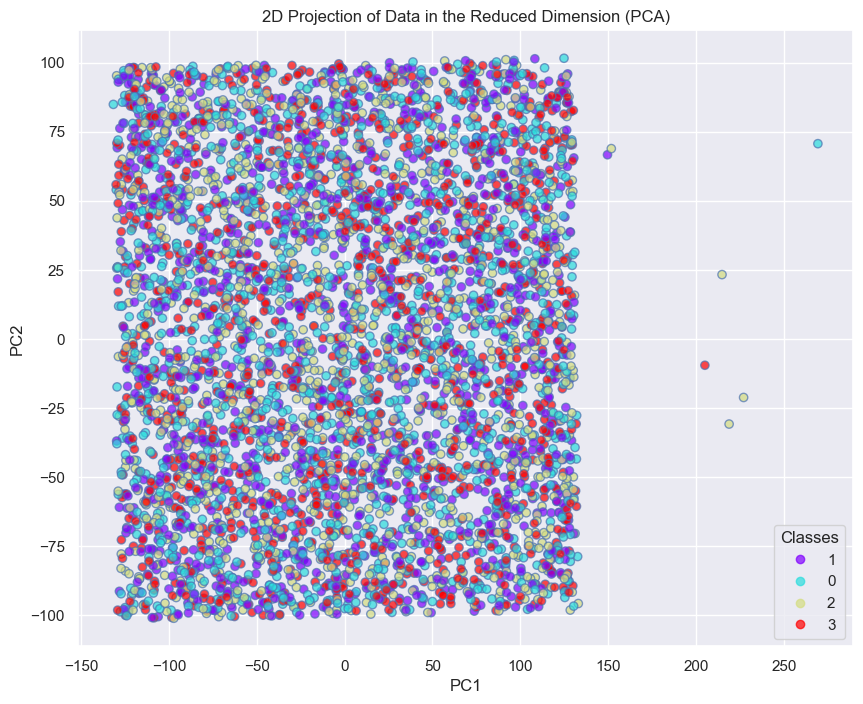

In [104]:
plt.figure(figsize=(10, 8))
if isinstance(target_pca, pd.DataFrame):
    target_pca = target_pca.values
scatter_pca = plt.scatter(
    target_pca[:, 0],
    target_pca[:, 1],
    c=y,
    cmap='rainbow',
    alpha=0.7,
    edgecolors='b'
)
legend_labels_pca = y.cat.categories if hasattr(y, 'cat') else y.unique()
handles_pca, _ = scatter_pca.legend_elements(prop="colors")
plt.legend(handles_pca, legend_labels_pca, title="Classes")
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title("2D Projection of Data in the Reduced Dimension (PCA)")
plt.show()

## 5.2 LDA

In [106]:
#I'm using a new df name here and setting the X and Y
target_lda = df
X = target_lda.drop('disease', axis=1)
y = target_lda['disease']
y = pd.Categorical(y)
df = X.join(pd.Series(y, name='class'))

class_feature_means = pd.DataFrame()

#I groued them by 'class' and calculate the mean for each group
for c, rows in df.groupby('class'):
    class_feature_means[c] = rows.drop(columns='class').mean()

#I then transposed the df to have classes as columns
class_feature_means = class_feature_means.T

#Then I show the results
class_feature_means.T

,0,1,2,3
age,49.312399,48.720191,48.704509,48.490461
bmi,27.005765,27.280924,27.348101,27.652183
blood_pressure,129.618357,129.648649,129.665862,130.041335
cholesterol,200.035427,199.874404,200.103060,198.671701
glucose,135.510467,133.143084,135.921095,134.564388
insulin,144.247987,143.870429,142.209340,147.180445
heart_rate,79.066023,79.587440,80.020129,79.610493
smoker,0.521739,0.498410,0.495169,0.526232
physical_activity,1.016908,1.038951,1.013688,1.020668
sleep_time,7.595008,7.422099,7.489533,7.423688


Then I just go ahead on with the LDA, so this cell calculates the within-class scatter matrix for a dataset

In [107]:
within_class_scatter_matrix = np.zeros((14, 14))
for c, rows in df.groupby('class'):
    rows = rows.drop(['class'], axis=1)
    
    s = np.zeros((14, 14))
    for index, row in rows.iterrows():
        x, mc = row.values.reshape(14, 1), class_feature_means.loc[c].values.reshape(14, 1)
        
        s += (x - mc).dot((x - mc).T)
    
    within_class_scatter_matrix += s

I used this to then find the directions that maximize the separation between classes

In [108]:
feature_means = df.drop(['class'], axis=1).mean()

between_class_scatter_matrix = np.zeros((14, 14))
for c in class_feature_means.index:
    n = len(df.loc[df['class'] == c].index)
    
    mc = class_feature_means.loc[c].values.reshape(14, 1)
    m = feature_means.values.reshape(14, 1)
    
    between_class_scatter_matrix += n * (mc - m).dot((mc - m).T)

This then calculates the eigenvalue decomposition

In [109]:
eigen_values, eigen_vectors = np.linalg.eig(np.linalg.inv(within_class_scatter_matrix).dot(between_class_scatter_matrix))

This cell deals with the eigenvalues and eigenvectors computed in the last cell

In [110]:
pairs = [(np.abs(eigen_values[i]), eigen_vectors[:,i]) for i in range(len(eigen_values))]
pairs = sorted(pairs, key=lambda x: x[0], reverse=True)
for pair in pairs:
    print(pair[0])

0.003544599372826104
0.002234602435083816
0.0013733602920597118
1.9919386389479187e-19
1.819895201990137e-19
1.819895201990137e-19
1.7145971982571568e-19
1.6040427716207773e-19
1.4615007816649038e-19
1.4615007816649038e-19
1.1349246594599011e-19
7.133302834230346e-20
7.133302834230346e-20
2.19004220053227e-20


We can see the first three are quite a lot bigger than the rest.

This cell calculated and printed the explained variance for each eigenvector, which was again, done in the earlier cell

In [111]:
eigen_value_sums = sum(eigen_values)
print('Explained Variance')
for i, pair in enumerate(pairs):
    print('Eigenvector {}: {}'.format(i, (pair[0]/eigen_value_sums).real))

Explained Variance
Eigenvector 0: 0.49557058341949295
Eigenvector 1: 0.31241985792661675
Eigenvector 2: 0.19200955865389033
Eigenvector 3: 2.784930226549695e-17
Eigenvector 4: 2.5443962269098843e-17
Eigenvector 5: 2.5443962269098843e-17
Eigenvector 6: 2.397179044785136e-17
Eigenvector 7: 2.242612855647332e-17
Eigenvector 8: 2.0433248411378477e-17
Eigenvector 9: 2.0433248411378477e-17
Eigenvector 10: 1.5867386309931093e-17
Eigenvector 11: 9.973073612685771e-18
Eigenvector 12: 9.973073612685771e-18
Eigenvector 13: 3.061898897098102e-18


Here I made a matrix W with the first two eigenvectors.

In [112]:
w_matrix = np.hstack((pairs[0][1].reshape(14,1), pairs[1][1].reshape(14,1))).real

This transforms X by projecting the original data X onto the lower-dimensional space

In [113]:
X_lda = np.array(X.dot(w_matrix))

Here I plotted the data as a function of the two LDA components and use a different color for each class, I also added a legend and some visual aids.

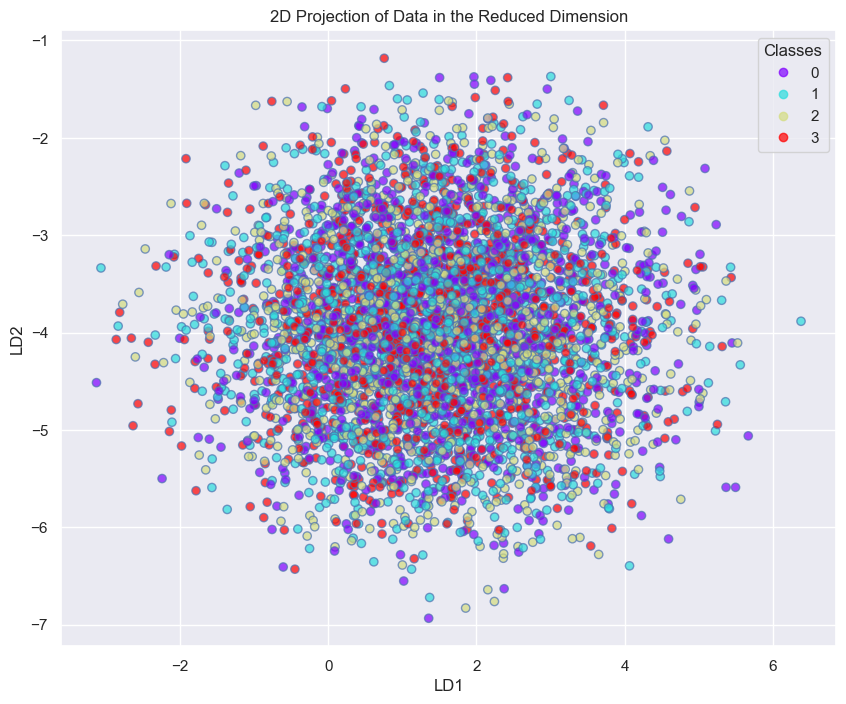

In [114]:
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    X_lda[:, 0],
    X_lda[:, 1],
    c=y,
    cmap='rainbow',
    alpha=0.7,
    edgecolors='b'
)
legend_labels = y.categories
handles, _ = scatter.legend_elements(prop="colors")
plt.legend(handles, legend_labels, title="Classes")
plt.xlabel('LD1')
plt.ylabel('LD2')
plt.title("2D Projection of Data in the Reduced Dimension")
plt.show()
("A 2D Projection Of Data with LDA")
plt.show()

Instead of adding the Linear Discriminant Analysis algorithm from scratch every time, I used the predefined LinearDiscriminantAnalysis class made in scikit-learn library.

In [115]:
lda = LinearDiscriminantAnalysis()
X_lda = lda.fit_transform(X, y)

I used the following property to obtain the variance explained by each component.

In [116]:
lda.explained_variance_ratio_

array([0.4956, 0.3124, 0.192 ])

And just coppied my last graph

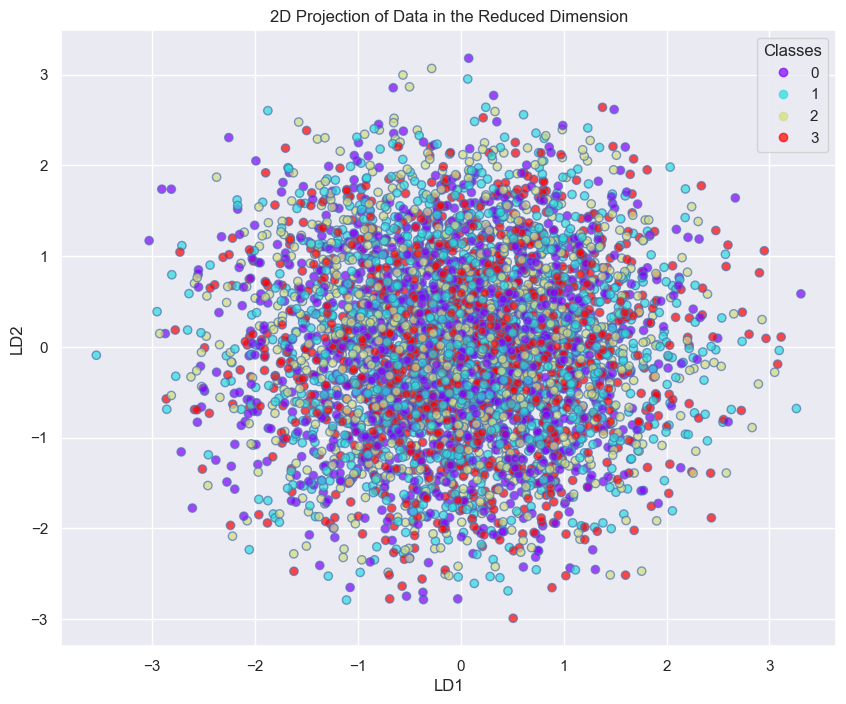

In [117]:
plt.figure(figsize=(10, 8))

scatter = plt.scatter(
    X_lda[:,0],
    X_lda[:,1],
    c=y,
    cmap='rainbow',
    alpha=0.7,
    edgecolors='b'
)
legend_labels = y.categories
handles, _ = scatter.legend_elements(prop="colors")
plt.legend(handles, legend_labels, title="Classes")
plt.xlabel('LD1')
plt.ylabel('LD2')
plt.title("2D Projection of Data in the Reduced Dimension")
plt.show()
("A 3D Projection Of Data In The Reduced Dimension")
plt.show()

In [118]:
X, y

(      age        bmi  blood_pressure  cholesterol  glucose  insulin  \
 0      56  27.577099            88.0        108.0     92.0    171.0   
 1      69  26.233744            88.0        252.0    102.0    179.0   
 2      46  29.646620           152.0        141.0     89.0    198.0   
 3      32  30.619597           106.0        273.0    159.0    222.0   
 4      60  16.794395            96.0        172.0    173.0     30.0   
 ...   ...        ...             ...          ...      ...      ...   
 4995   42  32.859689           174.0        140.0    107.0    248.0   
 4996   39  37.916078           113.0        184.0    180.0    200.0   
 4997   48  32.637416           143.0        188.0     82.0     77.0   
 4998   34  31.794482           108.0        141.0     76.0    117.0   
 4999   72  24.858529            82.0        219.0    136.0    203.0   
 
       heart_rate  smoker  physical_activity  sleep_time  \
 0           75.0       0                  2           9   
 1           7

I then copied this big cell again, but I made sure to use the X_lda which means I used the LDA data instead of the PCA data to train the models

In [119]:
X_train, X_val, y_train, y_val = train_test_split(X_lda, y, test_size=0.25, random_state=0)
seed = 0

names = [
    'Logistic Regression',
    'Nearest Neighbors',
    'Support Vectors',
    'Nu SVC',
    'Decision Tree',
    'Random Forest',
    'AdaBoost',
    'Gradient Boosting',
    'Naive Bayes',
    'Linear DA',
    'Quadratic DA',
    "Neural Net"]

classifiers = [
    LogisticRegression(solver="liblinear", random_state=seed),
    KNeighborsClassifier(2),
    SVC(probability=True, random_state=seed),
    NuSVC(probability=True, random_state=seed),
    DecisionTreeClassifier(random_state=seed),
    RandomForestClassifier(random_state=seed),
    AdaBoostClassifier(random_state=seed),
    GradientBoostingClassifier(random_state=seed),
    GaussianNB(),  
    LinearDiscriminantAnalysis(),  
    QuadraticDiscriminantAnalysis(),
    MLPClassifier(random_state=seed),
]

def score_summary(names, classifiers):
    results = []
    for name, clf in zip(names, classifiers):
        try:
            clf.fit(X_train, y_train)
            pred = clf.predict(X_val)
            
            accuracy = accuracy_score(y_val, pred)
            recall = recall_score(y_val, pred, average='macro')
            precision = precision_score(y_val, pred, average='macro')
            f1 = f1_score(y_val, pred, average='macro')
            
            roc_auc = np.nan
            if hasattr(clf, "predict_proba"):
                pred_proba = clf.predict_proba(X_val)
                if pred_proba.shape[1] == len(np.unique(y)):  
                    roc_auc = roc_auc_score(y_val, pred_proba, multi_class='ovr', average='macro')
            
            results.append({
                'Classifier': name,
                'Accuracy': accuracy,
                'Recall': recall,
                'Precision': precision,
                'F1': f1,
                'ROC_AUC': roc_auc
            })
        except Exception as e:
            print(f"Error with classifier {name}: {e}")
            results.append({
                'Classifier': name,
                'Accuracy': np.nan,
                'Recall': np.nan,
                'Precision': np.nan,
                'F1': np.nan,
                'ROC_AUC': np.nan
            })
    
    return pd.DataFrame(results)

summary = score_summary(names, classifiers)
summary = summary.sort_values(by='Accuracy', ascending=False)

styled_summary = summary.style.background_gradient(cmap='coolwarm', subset=['Accuracy', 'ROC_AUC'])\
    .bar(subset=["ROC_AUC"], color='#6495ED')\
    .bar(subset=["Recall"], color='#ff355d')\
    .bar(subset=["Precision"], color='lightseagreen')\
    .bar(subset=["F1"], color='gold')

styled_summary

,Classifier,Accuracy,Recall,Precision,F1,ROC_AUC
8,Naive Bayes,0.268000,0.267894,0.267871,0.267207,0.495628
0,Logistic Regression,0.265600,0.265637,0.265606,0.265173,0.495549
9,Linear DA,0.265600,0.265637,0.265597,0.265200,0.495663
10,Quadratic DA,0.263200,0.263081,0.264233,0.263057,0.494101
6,AdaBoost,0.253600,0.253455,0.253690,0.252878,0.487720
2,Support Vectors,0.246400,0.246662,0.246717,0.242686,0.490144
11,Neural Net,0.246400,0.246526,0.247165,0.245546,0.497569
1,Nearest Neighbors,0.245600,0.245863,0.238016,0.221159,0.500931
7,Gradient Boosting,0.244800,0.244978,0.246724,0.244268,0.489988
3,Nu SVC,0.239200,0.239764,0.245337,0.235525,0.498331


# Unsupervised

Finally, we have the last section which is our unsupervised model. This is to try and answer objectiev two, patient segmentation.
I use a kmeans model here to seperate the clusters, and then I perform some EDA on the results. I will walk you through it below.

Since df was changed in the previous section we are going to use our df_borrow which placed at the end of our data prep section

In [121]:
df_borrow

,age,bmi,blood_pressure,cholesterol,glucose,insulin,heart_rate,smoker,physical_activity,sleep_time,medical_history_score,income_level,stress_level,health_ins,disease
0,56,27.577099,88.0,108.0,92.0,171.0,75.0,0,2,9,5,0,1,0,1
1,69,26.233744,88.0,252.0,102.0,179.0,71.0,0,0,9,3,0,2,1,0
2,46,29.646620,152.0,141.0,89.0,198.0,90.0,1,1,5,5,2,2,0,2
3,32,30.619597,106.0,273.0,159.0,222.0,64.0,1,2,7,0,2,0,0,2
4,60,16.794395,96.0,172.0,173.0,30.0,99.0,1,1,7,3,0,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,42,32.859689,174.0,140.0,107.0,248.0,90.0,1,0,10,9,0,0,0,1
4996,39,37.916078,113.0,184.0,180.0,200.0,98.0,1,0,8,5,0,1,0,2
4997,48,32.637416,143.0,188.0,82.0,77.0,61.0,1,0,4,1,2,0,1,2
4998,34,31.794482,108.0,141.0,76.0,117.0,71.0,1,0,4,2,1,2,0,3


Here I'm naming a new dataset and fitting the PCA model to it

In [122]:
df_no_target = df_borrow.drop("disease", axis=1)
pca = PCA().fit(df_no_target) 

As we already know from the PCA vs LDA section, 6 components is the ideal number

In [123]:
scaler = StandardScaler()
scaled_ds = scaler.fit_transform(df_no_target)

pca = PCA(n_components=6)
PCA_ds = pd.DataFrame(pca.fit_transform(scaled_ds), columns=["col1", "col2", "col3","col4", "col5", "col6"])

summary = PCA_ds.describe().T
print(summary)

       count          mean       std       min       25%       50%       75%  \
col1  5000.0  3.552714e-17  1.043499 -3.134198 -0.735410 -0.003042  0.728982   
col2  5000.0  2.380318e-17  1.033700 -3.497100 -0.688671  0.004255  0.714812   
col3  5000.0 -3.961276e-17  1.029701 -3.242351 -0.706096  0.034445  0.683223   
col4  5000.0 -6.252776e-17  1.025628 -3.171199 -0.691683 -0.003950  0.722641   
col5  5000.0 -7.958079e-17  1.021892 -3.027471 -0.720062  0.017210  0.709683   
col6  5000.0  1.094236e-16  1.004613 -3.170941 -0.692696 -0.023305  0.690815   

           max  
col1  3.503592  
col2  3.595232  
col3  3.265120  
col4  3.285149  
col5  3.356059  
col6  3.454330  


Here I am plotting the first three components in a 3D space and using a Set1 colour map to distinguish between the classes easier. I improved the look of the graph in commit 6

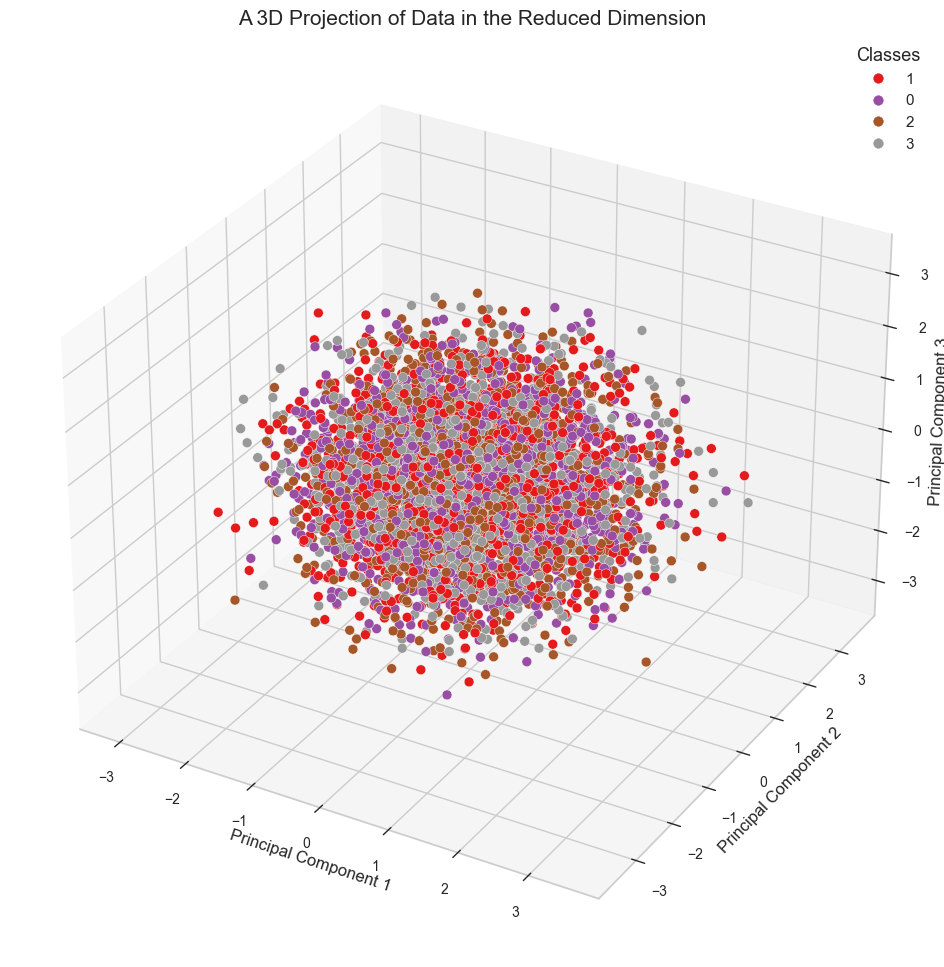

In [124]:
x = PCA_ds["col1"]
y = PCA_ds["col2"]
z = PCA_ds["col3"]

fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111, projection='3d')

cmap = plt.get_cmap('Set1')

scatter = ax.scatter(x, y, z, c=df_borrow['disease'].astype('category').cat.codes, cmap=cmap, alpha=1, edgecolors='w', s=50)

ax.set_title("A 3D Projection of Data in the Reduced Dimension", fontsize=15)
ax.set_xlabel('Principal Component 1', fontsize=12)
ax.set_ylabel('Principal Component 2', fontsize=12)
ax.set_zlabel('Principal Component 3', fontsize=12)

handles, labels = scatter.legend_elements(prop="colors")
labels = df_borrow['disease'].unique()  
legend = ax.legend(handles, labels, title="Classes", title_fontsize='13', fontsize='11')

plt.show()

I used the elbow method with the elbow visuliaser to find the ideal amount of clusters to use in the kmeans model

## 6.1 Elbow Method

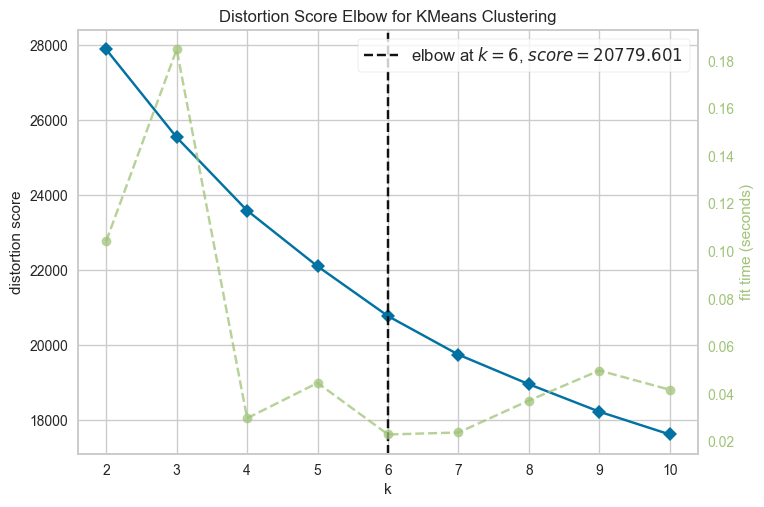

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [125]:
Elbow_M = KElbowVisualizer(KMeans(random_state=0), k=10)
Elbow_M.fit(PCA_ds)
Elbow_M.show()

Here I am running the k means model and adding cluster labels 

## 6.2 KMeans Model

In [126]:
kmeans = KMeans(n_clusters=6, random_state=0)
yhat_kmeans = kmeans.fit_predict(PCA_ds)

PCA_ds["Clusters"] = yhat_kmeans
df["Clusters"] = yhat_kmeans

Now I'm copying the code from the last graph but this time I'm using the labels/data from the previous cell (kmeans clusters)

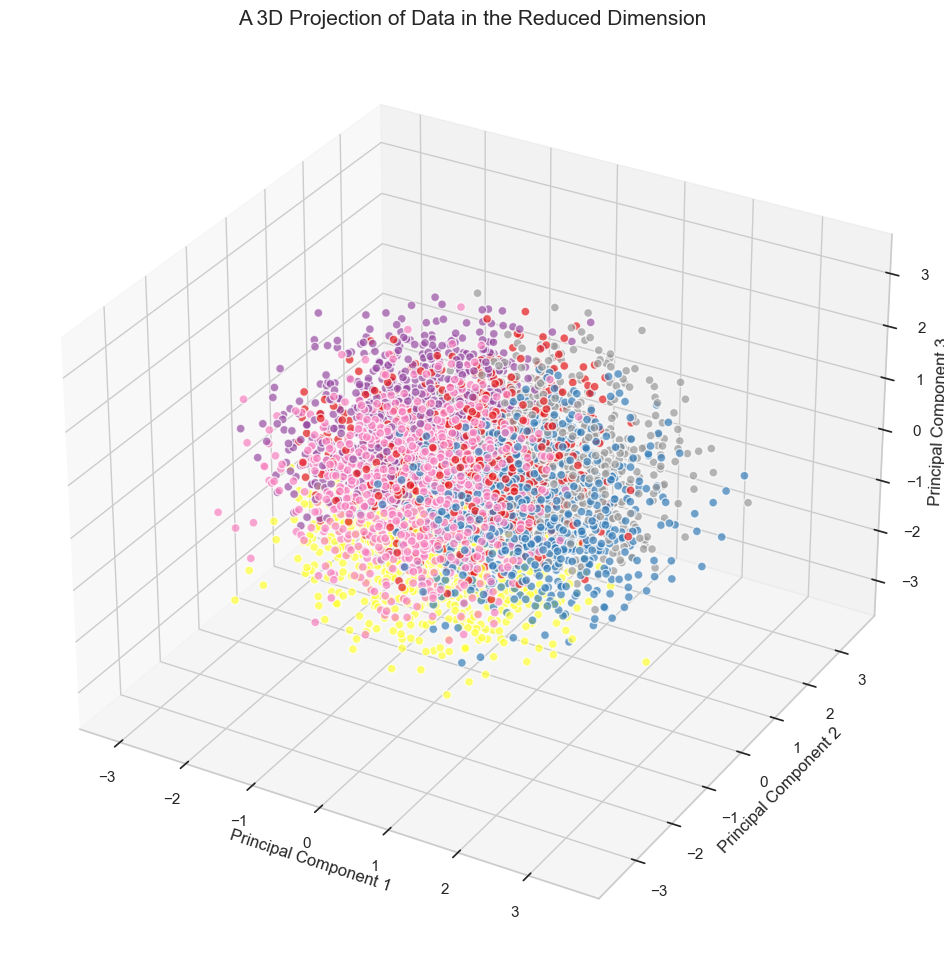

In [229]:
x = PCA_ds['col1']
y = PCA_ds['col2']
z = PCA_ds['col3']

fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(111, projection='3d')

cmap = plt.get_cmap('Set1')
ax.scatter(x, y, z, s=40, c=PCA_ds["Clusters"], marker='o', cmap=cmap, alpha=0.7, edgecolors='w')
ax.set_title("The Plot Of The Clusters")

ax.set_title("A 3D Projection of Data in the Reduced Dimension", fontsize=15)
ax.set_xlabel('Principal Component 1', fontsize=12)
ax.set_ylabel('Principal Component 2', fontsize=12)
ax.set_zlabel('Principal Component 3', fontsize=12)

plt.show()
plt.show()

Then I plot the clusters on a barchart with their count as a perentage of the total visible above their respective bar

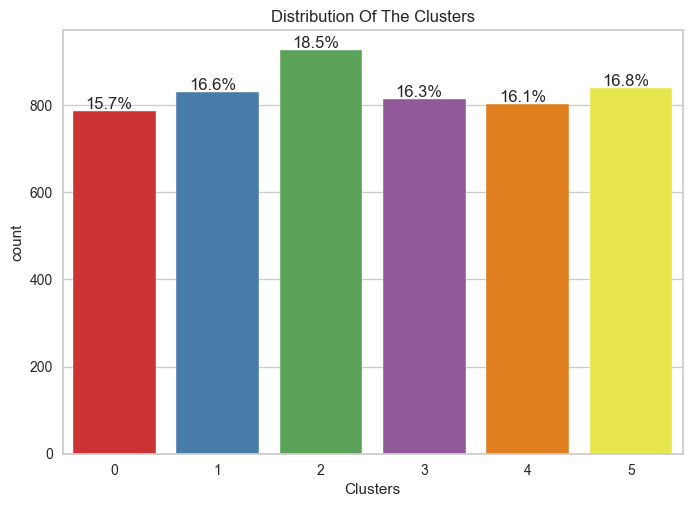

In [128]:
pl = sns.countplot(x=df["Clusters"], palette='Set1')
pl.set_title("Distribution Of The Clusters")

total = len(df["Clusters"])
for p in pl.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width() / 2 - 0.05
    y = p.get_height() + 5
    pl.annotate(percentage, (x, y), ha='center')

plt.show()
plt.show()

In [129]:
df

,age,bmi,blood_pressure,cholesterol,glucose,insulin,heart_rate,smoker,physical_activity,sleep_time,medical_history_score,income_level,stress_level,health_ins,class,Clusters
0,56,27.577099,88.0,108.0,92.0,171.0,75.0,0,2,9,5,0,1,0,1,0
1,69,26.233744,88.0,252.0,102.0,179.0,71.0,0,0,9,3,0,2,1,0,0
2,46,29.646620,152.0,141.0,89.0,198.0,90.0,1,1,5,5,2,2,0,2,1
3,32,30.619597,106.0,273.0,159.0,222.0,64.0,1,2,7,0,2,0,0,2,1
4,60,16.794395,96.0,172.0,173.0,30.0,99.0,1,1,7,3,0,2,0,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,42,32.859689,174.0,140.0,107.0,248.0,90.0,1,0,10,9,0,0,0,1,4
4996,39,37.916078,113.0,184.0,180.0,200.0,98.0,1,0,8,5,0,1,0,2,3
4997,48,32.637416,143.0,188.0,82.0,77.0,61.0,1,0,4,1,2,0,1,2,4
4998,34,31.794482,108.0,141.0,76.0,117.0,71.0,1,0,4,2,1,2,0,3,4


## 6.3 EDA

Here I compare two features at a time with our clusters as our hue. This should tell us more about our patient segments.

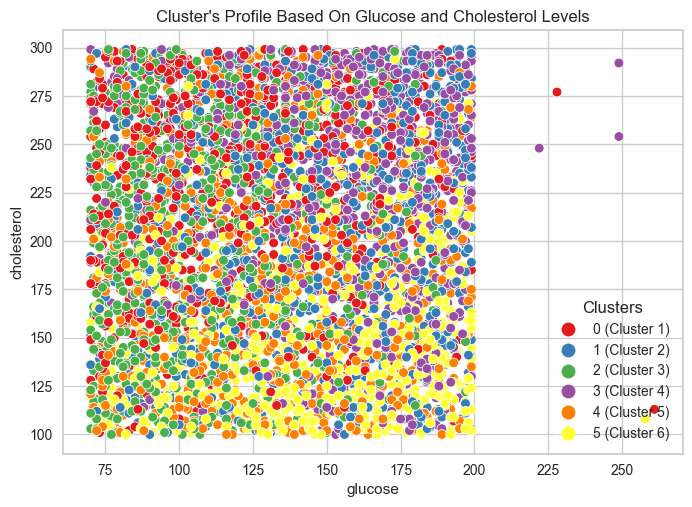

In [130]:
pl = sns.scatterplot(data=df_borrow, x="glucose", y="cholesterol", hue=df["Clusters"], palette='Set1')

legend_labels = {0: "Cluster 1", 
                 1: "Cluster 2", 
                 2: "Cluster 3", 
                 3: "Cluster 4",
                 4: "Cluster 5",
                 5: "Cluster 6"}

palette = sns.color_palette('Set1', n_colors=len(legend_labels))

handles = [Line2D([0], [0], 
                  marker='o', 
                  color='w', 
                  label=f'{key} ({legend_labels[key]})', 
                  markerfacecolor=palette[key], 
                  markersize=10) 
           for key in legend_labels]

pl.set_title("Cluster's Profile Based On Glucose and Cholesterol Levels")
plt.legend(handles=handles, title="Clusters", loc="lower right")
plt.show()

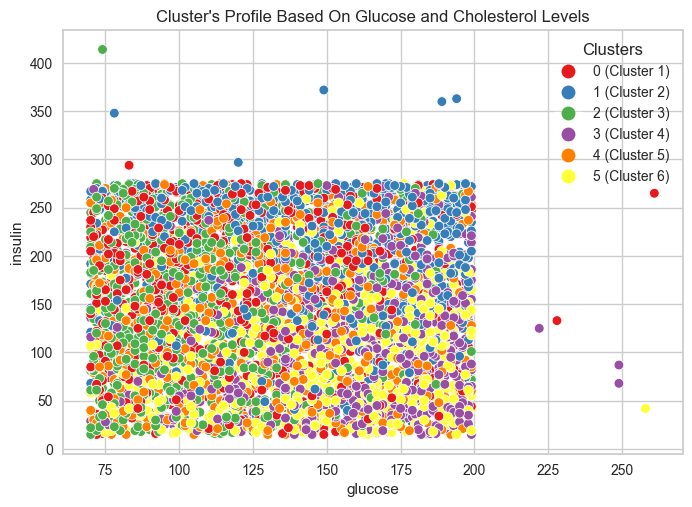

In [131]:
pl = sns.scatterplot(data=df_borrow, x="glucose", y="insulin", hue=df["Clusters"], palette='Set1')

legend_labels = {0: "Cluster 1", 
                 1: "Cluster 2", 
                 2: "Cluster 3", 
                 3: "Cluster 4",
                 4: "Cluster 5",
                 5: "Cluster 6"}

palette = sns.color_palette('Set1', n_colors=len(legend_labels))

handles = [Line2D([0], [0], 
                  marker='o', 
                  color='w', 
                  label=f'{key} ({legend_labels[key]})', 
                  markerfacecolor=palette[key], 
                  markersize=10) 
           for key in legend_labels]

pl.set_title("Cluster's Profile Based On Glucose and Cholesterol Levels")
plt.legend(handles=handles, title="Clusters", loc="upper right")
plt.show()

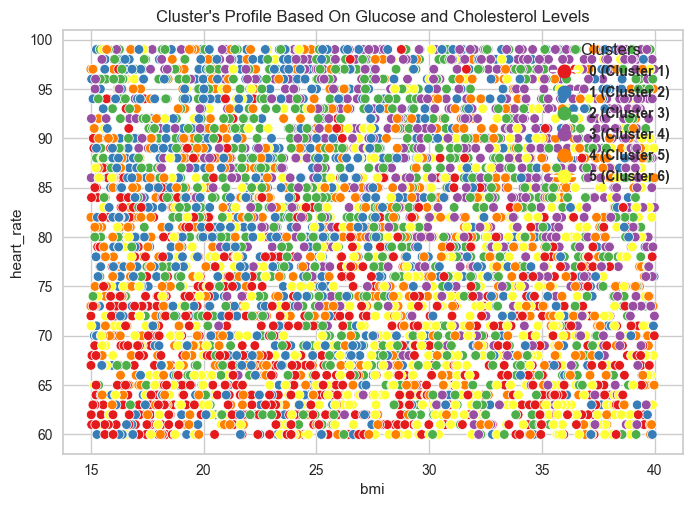

In [132]:
pl = sns.scatterplot(data=df_borrow, x="bmi", y="heart_rate", hue=df["Clusters"], palette='Set1')

legend_labels = {0: "Cluster 1", 
                 1: "Cluster 2", 
                 2: "Cluster 3", 
                 3: "Cluster 4",
                 4: "Cluster 5",
                 5: "Cluster 6"}

palette = sns.color_palette('Set1', n_colors=len(legend_labels))

handles = [Line2D([0], [0], 
                  marker='o', 
                  color='w', 
                  label=f'{key} ({legend_labels[key]})', 
                  markerfacecolor=palette[key], 
                  markersize=10) 
           for key in legend_labels]

pl.set_title("Cluster's Profile Based On Glucose and Cholesterol Levels")
plt.legend(handles=handles, title="Clusters", loc="upper right", prop={'weight': 'bold'})
plt.show()

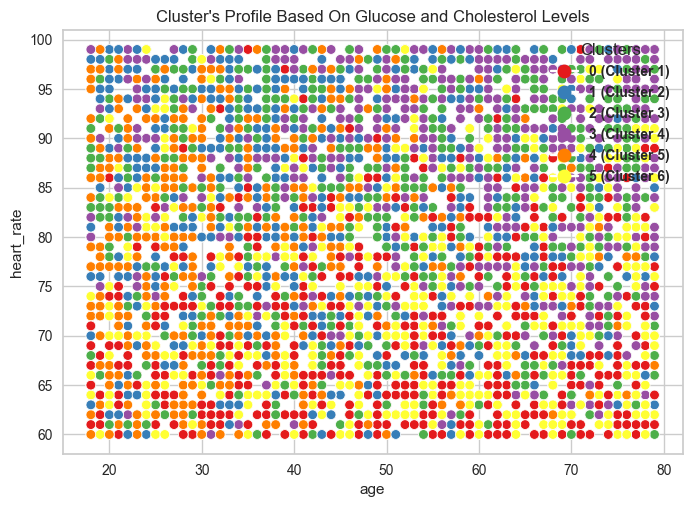

In [133]:
pl = sns.scatterplot(data=df_borrow, x="age", y="heart_rate", hue=df["Clusters"], palette='Set1')

legend_labels = {0: "Cluster 1", 
                 1: "Cluster 2", 
                 2: "Cluster 3", 
                 3: "Cluster 4",
                 4: "Cluster 5",
                 5: "Cluster 6"}

palette = sns.color_palette('Set1', n_colors=len(legend_labels))

handles = [Line2D([0], [0], 
                  marker='o', 
                  color='w', 
                  label=f'{key} ({legend_labels[key]})', 
                  markerfacecolor=palette[key], 
                  markersize=10) 
           for key in legend_labels]

pl.set_title("Cluster's Profile Based On Glucose and Cholesterol Levels")
plt.legend(handles=handles, title="Clusters", loc="upper right", prop={'weight': 'bold'})
plt.show()

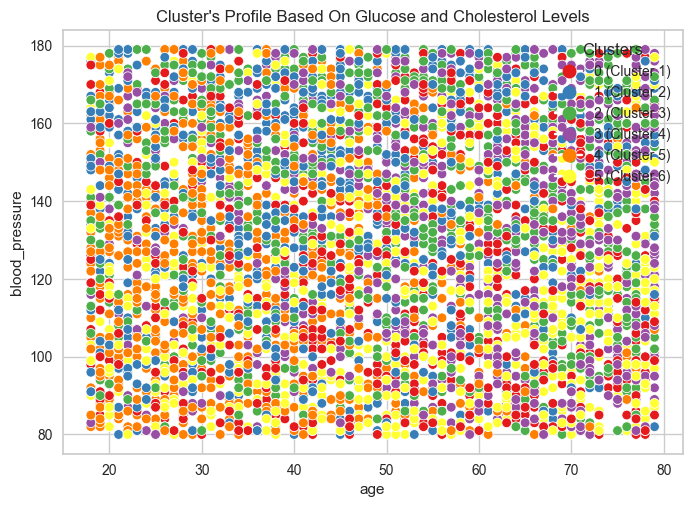

In [134]:
pl = sns.scatterplot(data=df_borrow, x="age", y="blood_pressure", hue=df["Clusters"], palette='Set1')

legend_labels = {0: "Cluster 1", 
                 1: "Cluster 2", 
                 2: "Cluster 3", 
                 3: "Cluster 4",
                 4: "Cluster 5",
                 5: "Cluster 6"}

palette = sns.color_palette('Set1', n_colors=len(legend_labels))

handles = [Line2D([0], [0], 
                  marker='o', 
                  color='w', 
                  label=f'{key} ({legend_labels[key]})', 
                  markerfacecolor=palette[key], 
                  markersize=10) 
           for key in legend_labels]

pl.set_title("Cluster's Profile Based On Glucose and Cholesterol Levels")
plt.legend(handles=handles, title="Clusters", loc="upper right")
plt.show()

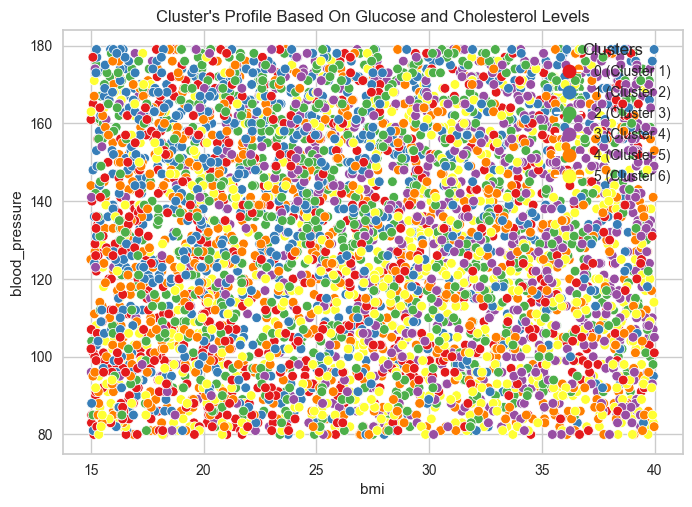

In [135]:
pl = sns.scatterplot(data=df_borrow, x="bmi", y="blood_pressure", hue=df["Clusters"], palette='Set1')

legend_labels = {0: "Cluster 1", 
                 1: "Cluster 2", 
                 2: "Cluster 3", 
                 3: "Cluster 4",
                 4: "Cluster 5",
                 5: "Cluster 6"}

palette = sns.color_palette('Set1', n_colors=len(legend_labels))

handles = [Line2D([0], [0], 
                  marker='o', 
                  color='w', 
                  label=f'{key} ({legend_labels[key]})', 
                  markerfacecolor=palette[key], 
                  markersize=10) 
           for key in legend_labels]

pl.set_title("Cluster's Profile Based On Glucose and Cholesterol Levels")
plt.legend(handles=handles, title="Clusters", loc="upper right")
plt.show()